In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import math
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings("ignore")

In [35]:
df = pd.read_excel('traffic_1122.xlsx')
df

,ID,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction
0,20161030131,12,6,1,11,1,31,2015-11-01 00:00:00,1
1,20160516091,19,7,2,7,3,38,2015-11-01 01:00:00,1
2,20170121193,4,2,2,2,3,13,2015-11-01 02:00:00,3
3,20160413151,16,9,1,14,3,43,2015-11-01 03:00:00,1
4,20170223092,10,6,1,14,0,25,2015-11-01 04:00:00,2
...,...,...,...,...,...,...,...,...,...
19995,20170528011,19,9,1,2,0,45,2016-06-13 03:00:00,1
19996,20170302023,4,2,2,2,1,11,2016-06-13 04:00:00,3
19997,20160529212,4,2,2,2,2,12,2016-06-13 05:00:00,2
19998,20170502041,19,7,2,7,1,36,2016-06-13 06:00:00,1


In [36]:
df.head()

,ID,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction
0,20161030131,12,6,1,11,1,31,2015-11-01 00:00:00,1
1,20160516091,19,7,2,7,3,38,2015-11-01 01:00:00,1
2,20170121193,4,2,2,2,3,13,2015-11-01 02:00:00,3
3,20160413151,16,9,1,14,3,43,2015-11-01 03:00:00,1
4,20170223092,10,6,1,14,0,25,2015-11-01 04:00:00,2


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     20000 non-null  int64         
 1   Cars_or_Taxi           20000 non-null  int64         
 2   Buses_or_School_Buses  20000 non-null  int64         
 3   Moter_Bikes            20000 non-null  int64         
 4   Trucks_or_Trailers     20000 non-null  int64         
 5   Ambulance              20000 non-null  int64         
 6   Vehicles               20000 non-null  int64         
 7   DateTime               20000 non-null  datetime64[ns]
 8   Junction               20000 non-null  int64         
dtypes: datetime64[ns](1), int64(8)
memory usage: 1.4 MB


In [38]:
df['DateTime'] = pd.to_datetime(df['DateTime'])

In [39]:
df = df.drop('ID', axis=1)

In [ ]:
df.head()

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction
0,12,6,1,11,1,31,2015-11-01 00:00:00,1
1,19,7,2,7,3,38,2015-11-01 01:00:00,1
2,4,2,2,2,3,13,2015-11-01 02:00:00,3
3,16,9,1,14,3,43,2015-11-01 03:00:00,1
4,10,6,1,14,0,25,2015-11-01 04:00:00,2


Make a copy of data, just in case

In [ ]:
df_cp = df.copy()
df_cp.head()

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction
0,12,6,1,11,1,31,2015-11-01 00:00:00,1
1,19,7,2,7,3,38,2015-11-01 01:00:00,1
2,4,2,2,2,3,13,2015-11-01 02:00:00,3
3,16,9,1,14,3,43,2015-11-01 03:00:00,1
4,10,6,1,14,0,25,2015-11-01 04:00:00,2


Lets do some EDA of our data!

Text(0.5, 0, 'Date')

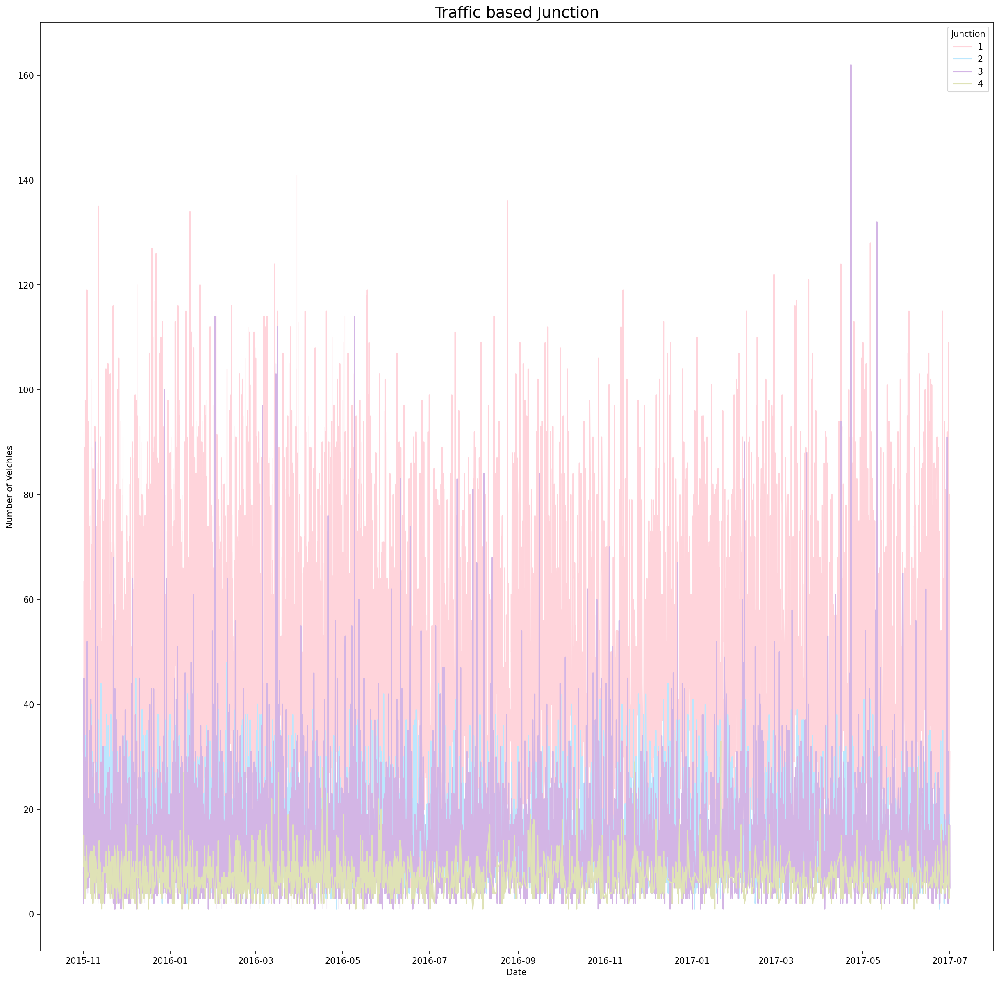

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Vehicles", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Veichles")
series.set_xlabel('Date')

Lets do the same for all type of vehicles!

Text(0.5, 0, 'Date')

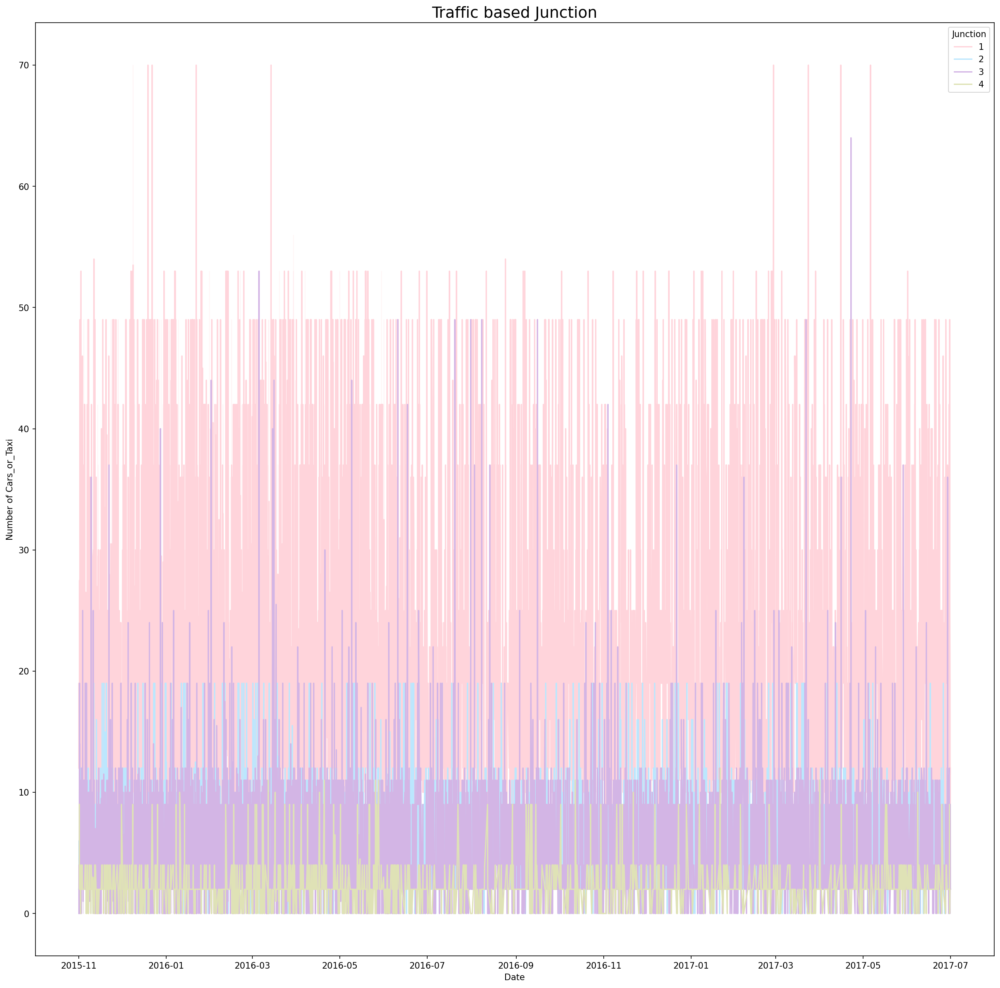

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Cars_or_Taxi", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Cars_or_Taxi")
series.set_xlabel('Date')

Text(0.5, 0, 'Date')

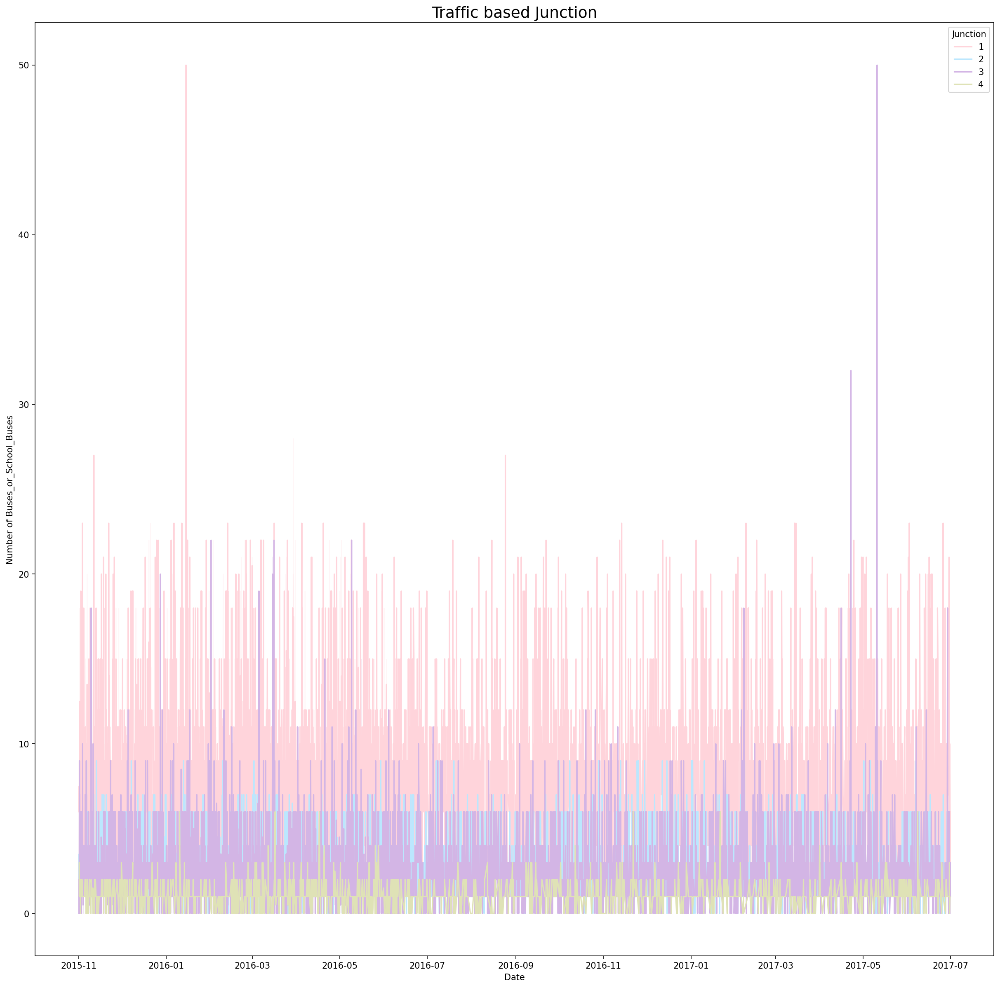

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Buses_or_School_Buses", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Buses_or_School_Buses")
series.set_xlabel('Date')

Text(0.5, 0, 'Date')

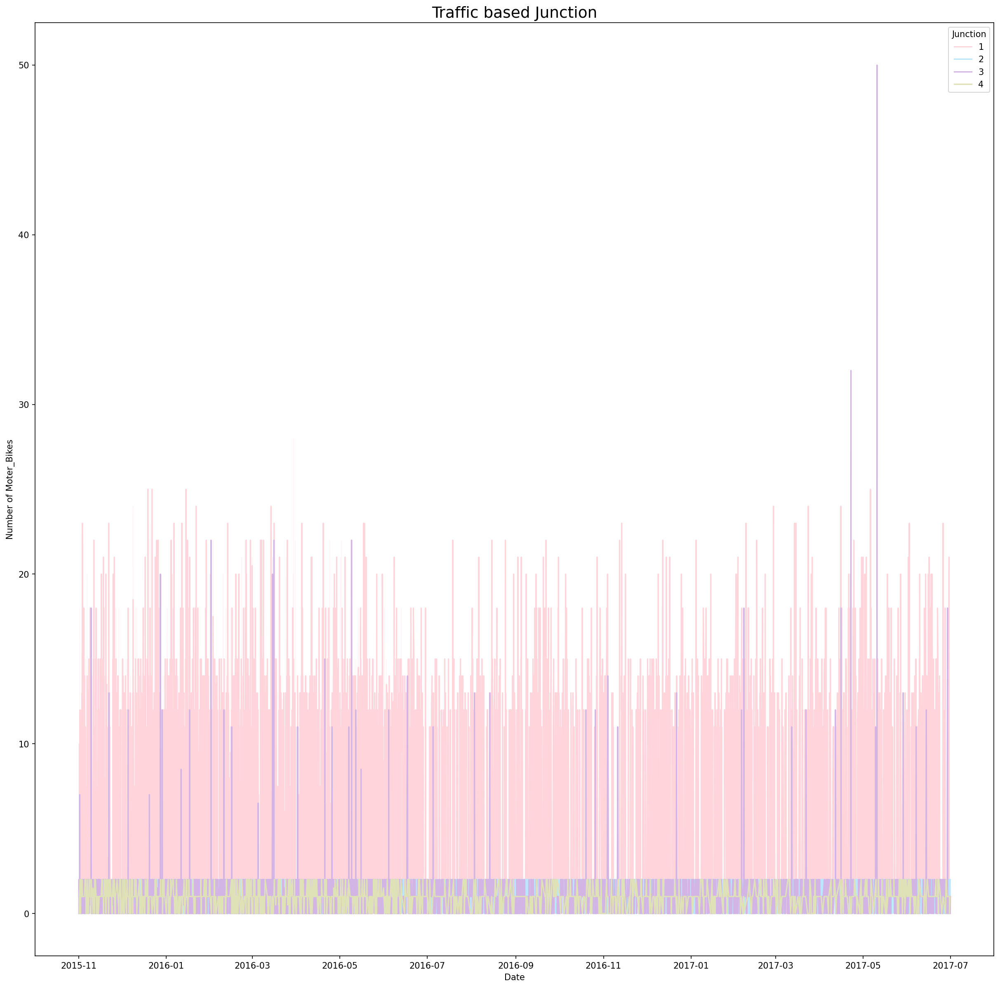

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Moter_Bikes", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Moter_Bikes")
series.set_xlabel('Date')

Text(0.5, 0, 'Date')

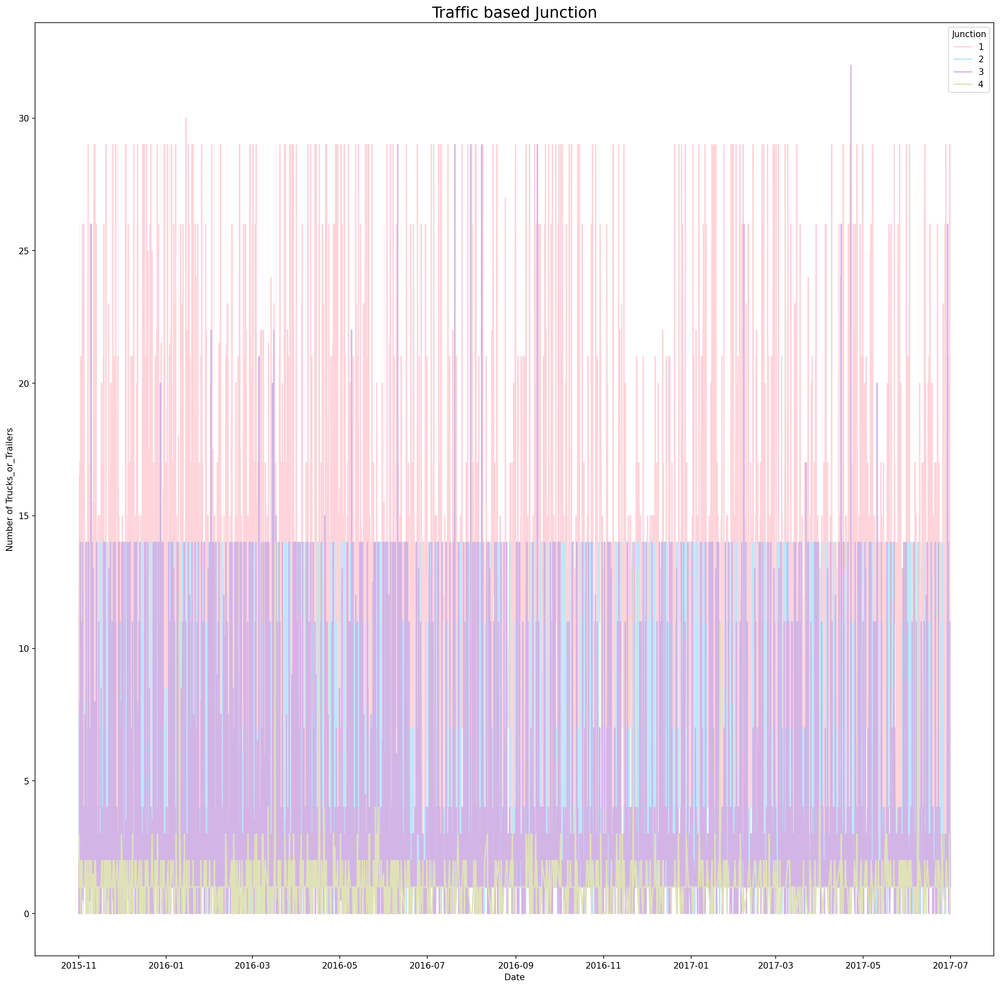

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Trucks_or_Trailers", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Trucks_or_Trailers")
series.set_xlabel('Date')

Text(0.5, 0, 'Date')

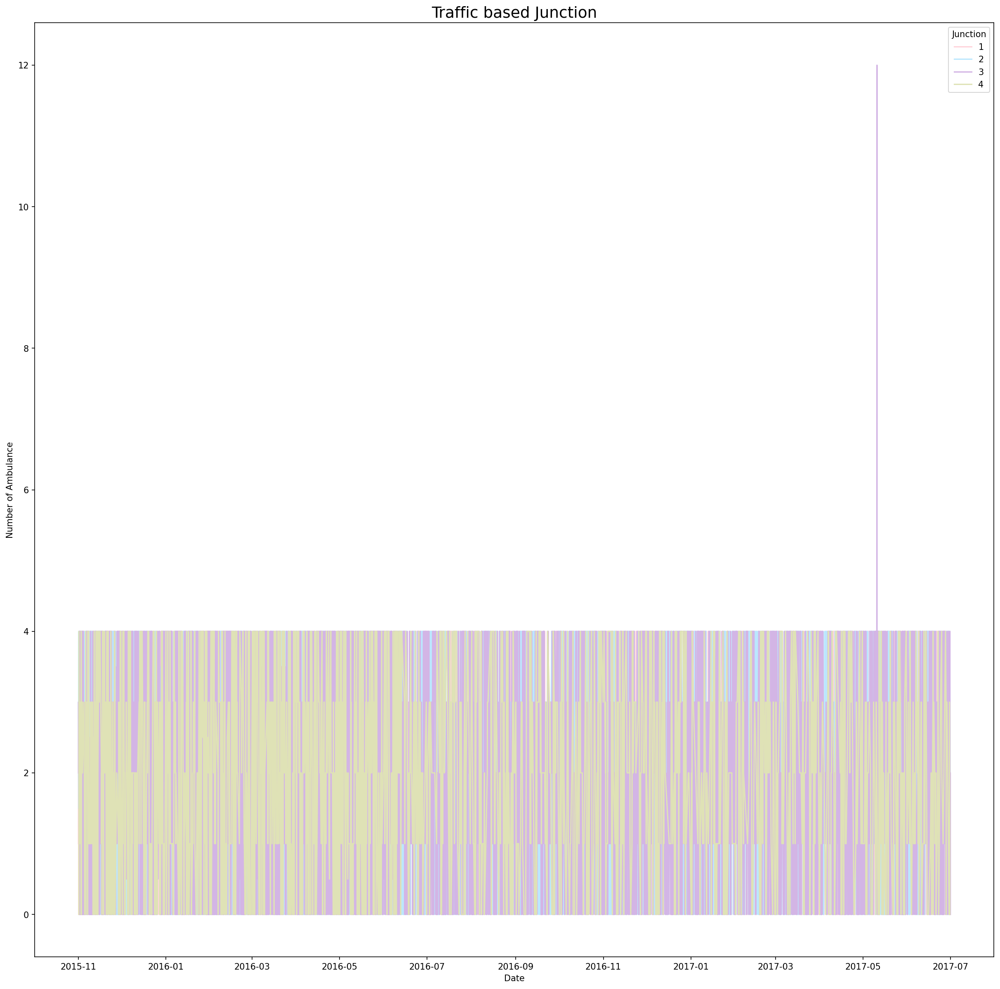

In [ ]:
palette = [ "#FFD4DB","#BBE7FE","#D3B5E5","#dfe2b6"]
plt.figure(figsize=(20, 20), dpi=150)
series = sns.lineplot(x=df_cp['DateTime'], y = "Ambulance", data=df_cp, hue="Junction", palette=palette)
series.set_title("Traffic based Junction", fontsize=18)
series.set_ylabel("Number of Ambulance")
series.set_xlabel('Date')

In [ ]:
df_cp['Year'] = df_cp['DateTime'].dt.year
df_cp['Month'] = df_cp['DateTime'].dt.month
df_cp['Date_no'] = df_cp['DateTime'].dt.day
df_cp['Hour'] = df_cp['DateTime'].dt.hour
df_cp['Day'] = df_cp.DateTime.dt.strftime("%A")
df_cp

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction,Year,Month,Date_no,Hour,Day
0,12,6,1,11,1,31,2015-11-01 00:00:00,1,2015,11,1,0,Sunday
1,19,7,2,7,3,38,2015-11-01 01:00:00,1,2015,11,1,1,Sunday
2,4,2,2,2,3,13,2015-11-01 02:00:00,3,2015,11,1,2,Sunday
3,16,9,1,14,3,43,2015-11-01 03:00:00,1,2015,11,1,3,Sunday
4,10,6,1,14,0,25,2015-11-01 04:00:00,2,2015,11,1,4,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19,9,1,2,0,45,2016-06-13 03:00:00,1,2016,6,13,3,Monday
19996,4,2,2,2,1,11,2016-06-13 04:00:00,3,2016,6,13,4,Monday
19997,4,2,2,2,2,12,2016-06-13 05:00:00,2,2016,6,13,5,Monday
19998,19,7,2,7,1,36,2016-06-13 06:00:00,1,2016,6,13,6,Monday


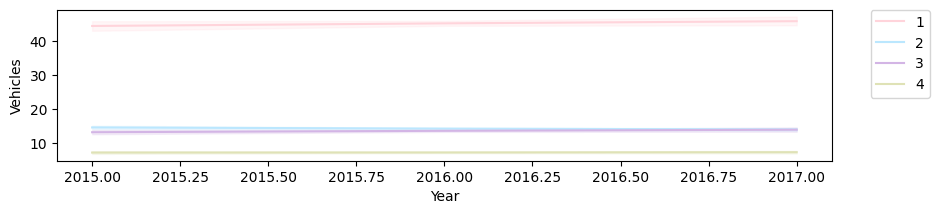

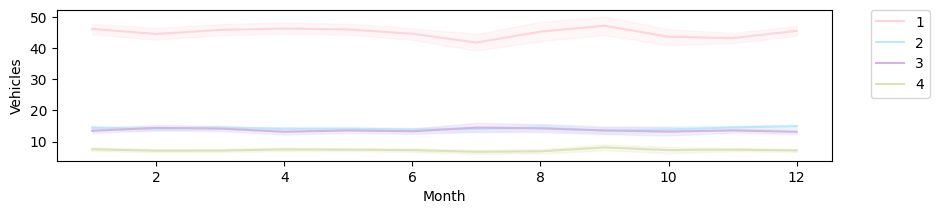

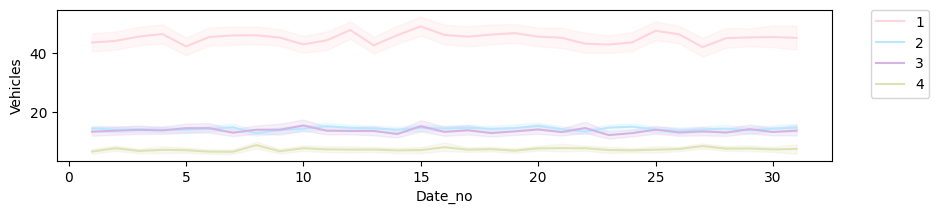

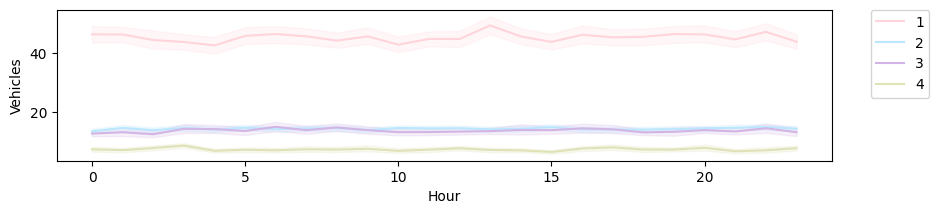

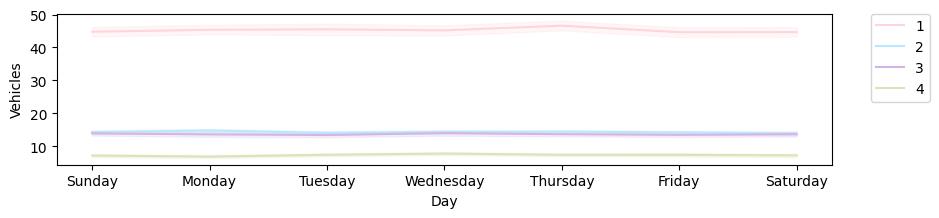

...

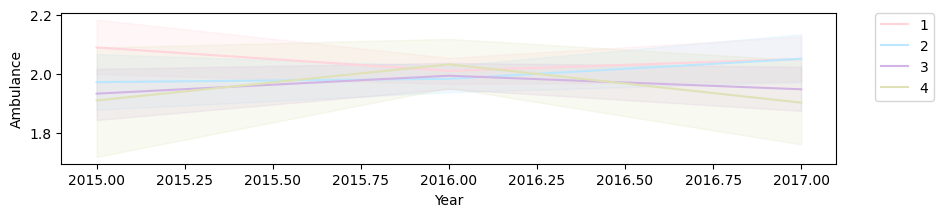

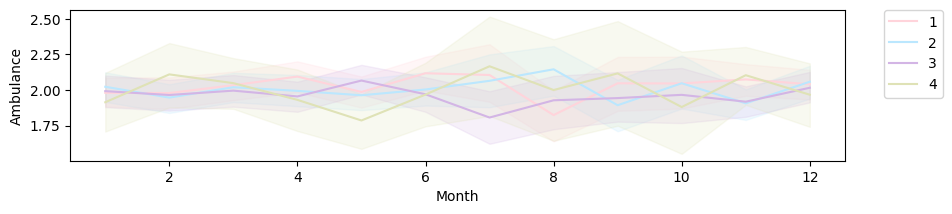

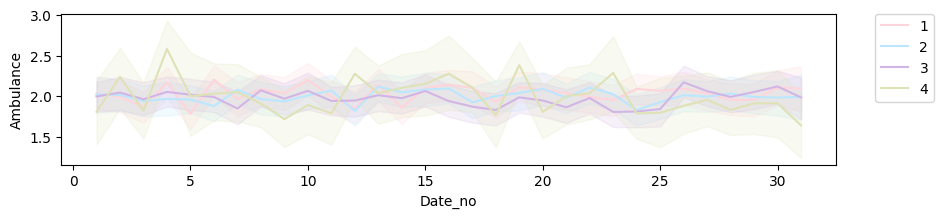

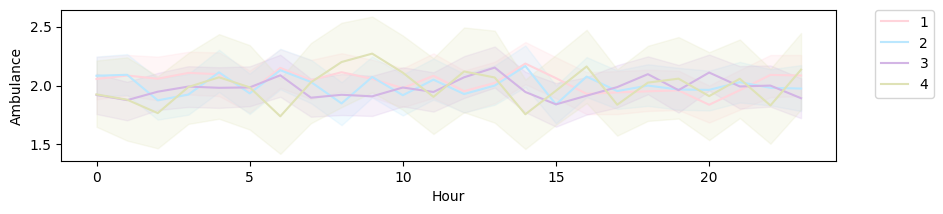

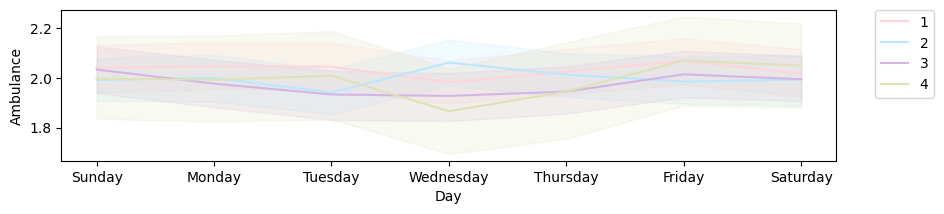

In [ ]:
features_created = ['Year', 'Month', 'Date_no', 'Hour', 'Day']
y_types=[	'Vehicles','Cars_or_Taxi'	,'Buses_or_School_Buses'	,'Moter_Bikes'	,'Trucks_or_Trailers'	,'Ambulance']

for Y in y_types:
  for i in features_created:
      plt.figure(figsize=(10, 2), dpi=100)
      ax = sns.lineplot(x=df_cp[i], y=Y, data=df, hue='Junction', palette = palette)
      plt.legend(bbox_to_anchor = (1.05, 1), loc=2, borderaxespad=0.)

We can learn alot from figures above, they show us the trends for all types of vehicles on all 4 junctions, Yearly, Monthly, Date, Hourly and Days respectively.

Text(0.5, 0, 'Year')

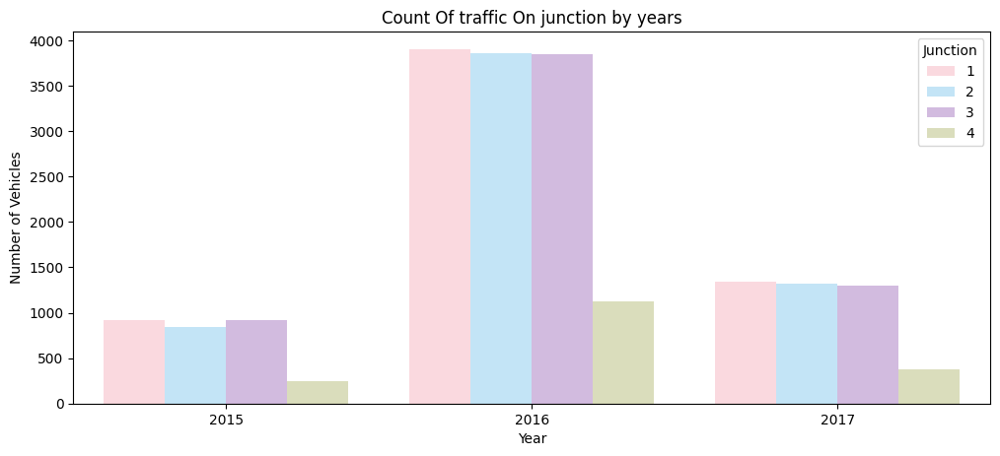

In [ ]:
plt.figure(figsize=(12, 5), dpi=100)
count = sns.countplot(data=df_cp, x = df_cp['Year'], hue = 'Junction', palette = palette)
count.set_title('Count Of traffic On junction by years')
count.set_ylabel("Number of Vehicles")
count.set_xlabel('Year')

In [ ]:
# for i in y_types:
#   plt.figure(figsize=(12, 5), dpi=100)
#   count = sns.countplot(data=df_cp, x = df_cp[i], hue = 'Junction', palette = palette)
#   count.set_title(f'Count Of {i} On junction by years')
#   count.set_ylabel(f"Number of {i}")
#   count.set_xlabel(f'{i}')

Heatmap about data attributes

* The value closer to 1 or -1 is best correlation to each other.
* As close as to -1, that pair of attribute is more negative correlation.
* As close as to 1, that pair of attribute is more positive correlation.
* As close as to 0, that pair of attribute is not correlating to each other.

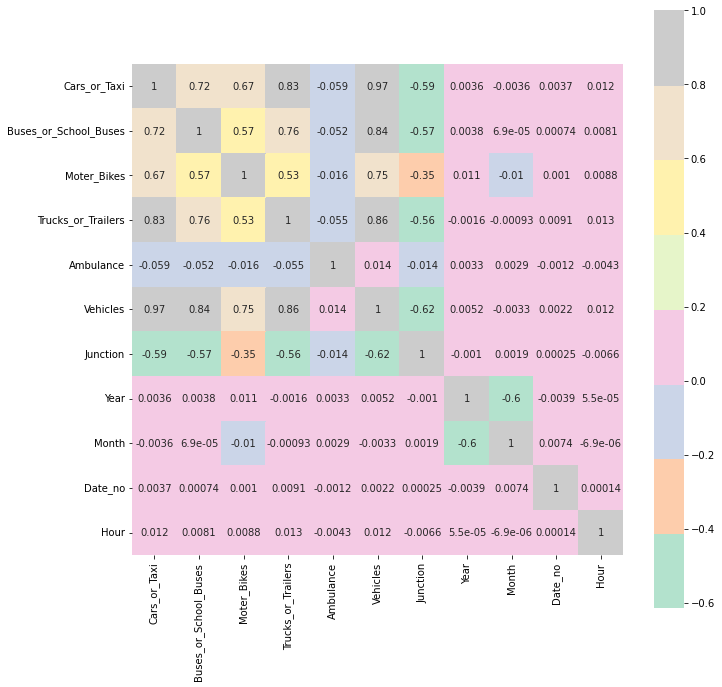

In [ ]:
corrmetrix = df_cp.corr()
plt.subplots(figsize=(11,11))
sns.heatmap(corrmetrix,cmap= "Pastel2",annot=True,square=True)

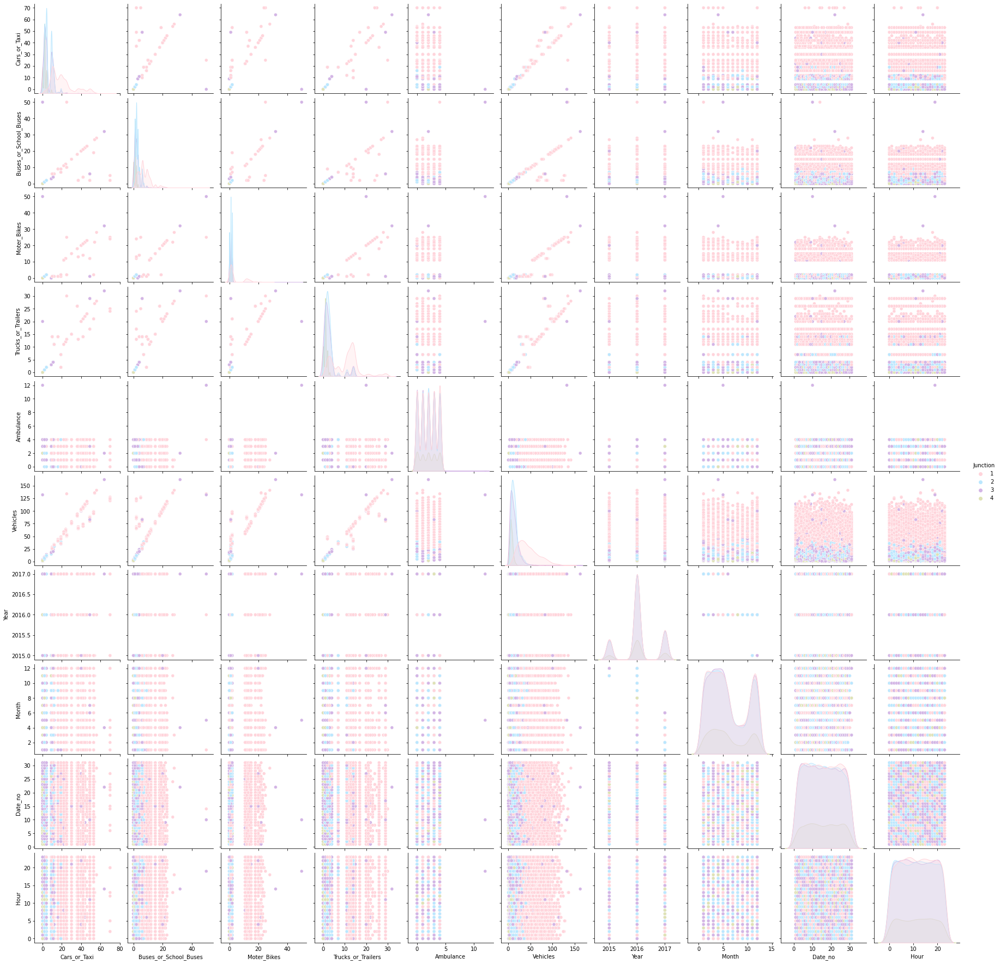

In [ ]:
sns.pairplot(data=df_cp, hue= "Junction",palette=palette)

In the EDA, we saw a weekly seasonality and an upwards trend over the years. In the above plot, it is again established that Junctions one and two have an upward trend. If we limit the span we will be able to further see the weekly seasonality.

We are again getting our data but this time index is DateTime, because we want to see the patterns in each Junction seperately.

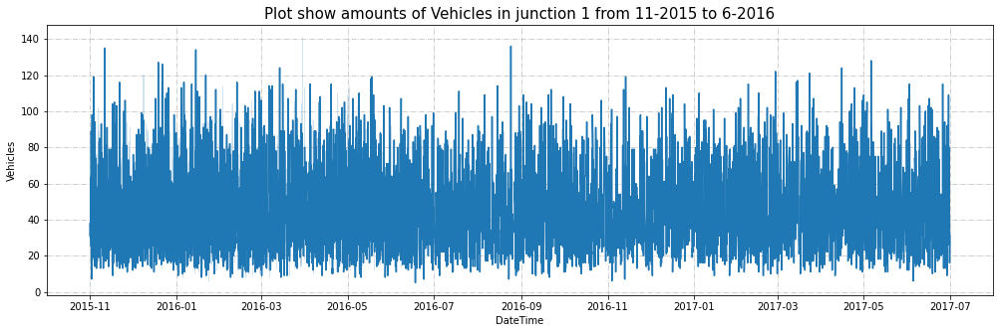

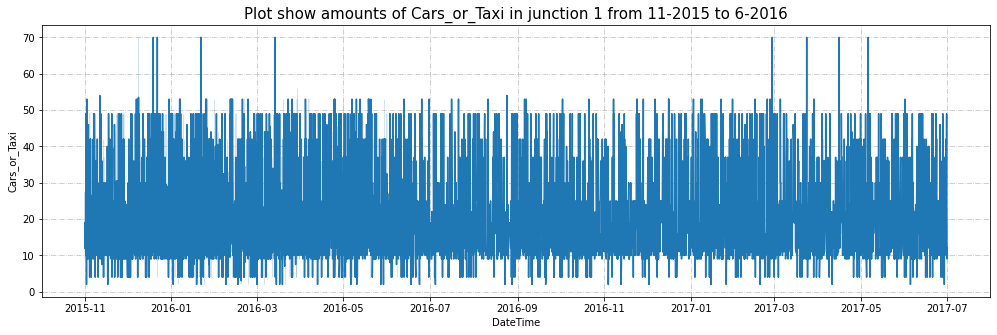

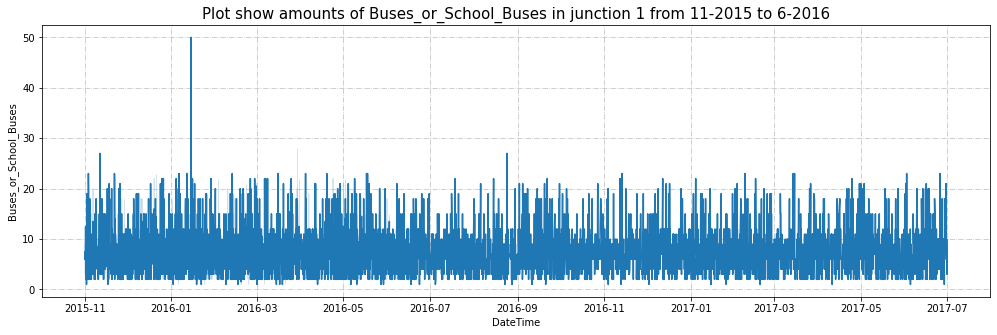

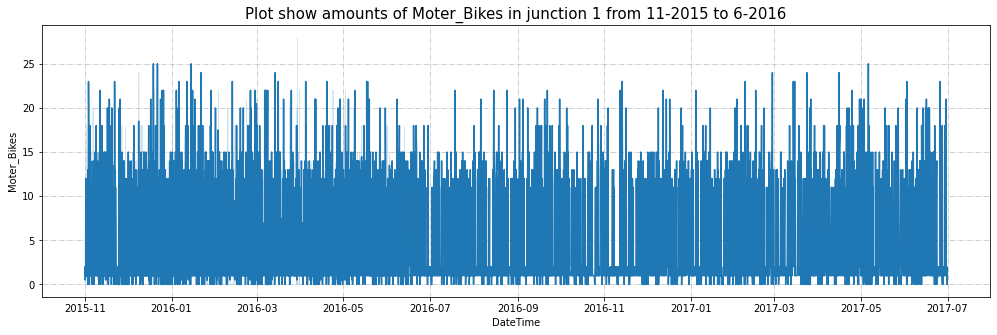

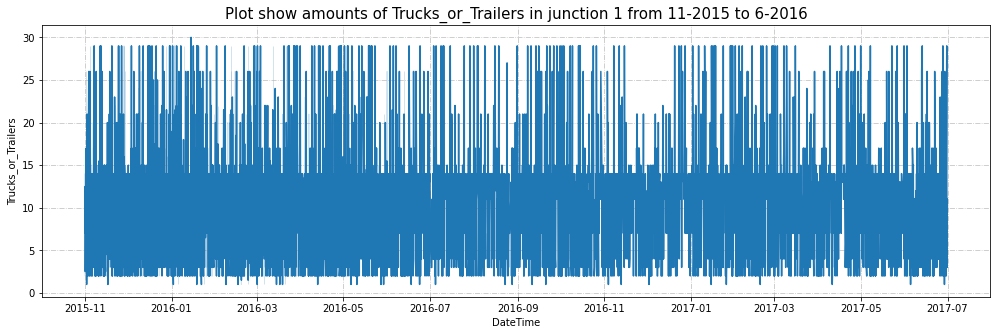

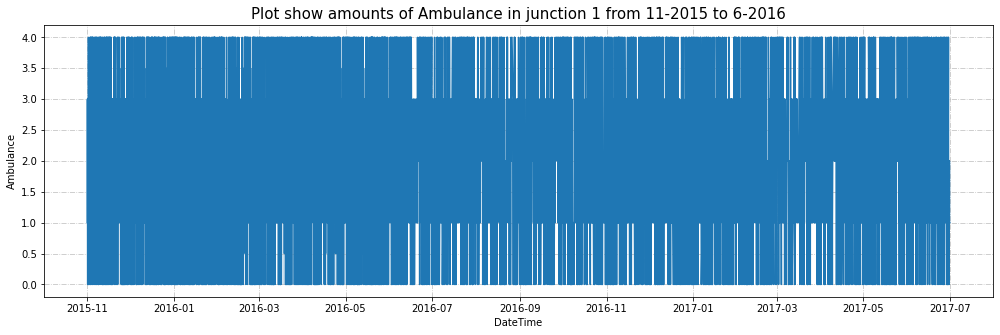

In [ ]:
for i in y_types:
  junction=1
  f, ax = plt.subplots(figsize=(17, 5))
  data=df_cp[df_cp.Junction == junction]
  ax = sns.lineplot(data=data, y=i, x='DateTime', ax=ax)
  start = data.head(1)
  end = data.tail(1)
  ax.set_title(f'Plot show amounts of {i} in junction {junction} from {start.Month[0]}-{start.Year[0]} to {end.Month[19998]}-{end.Year[19998]}', fontsize=15)
  ax.grid(True, ls='-.', alpha=0.75)
  plt.show()

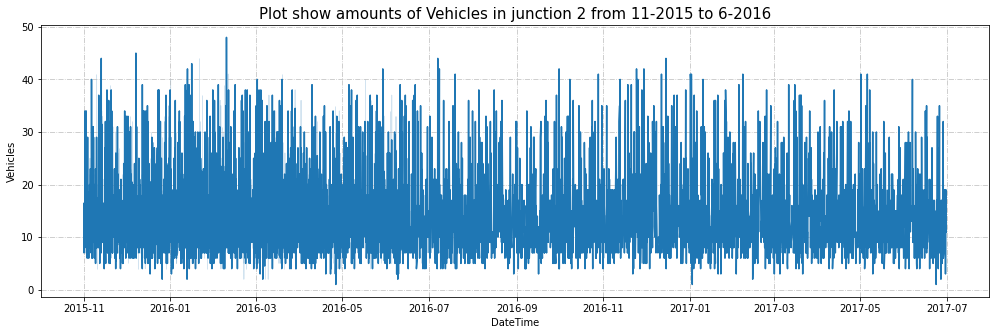

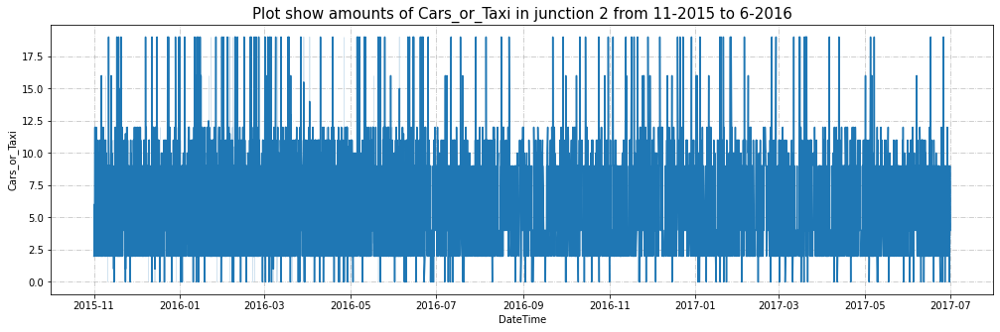

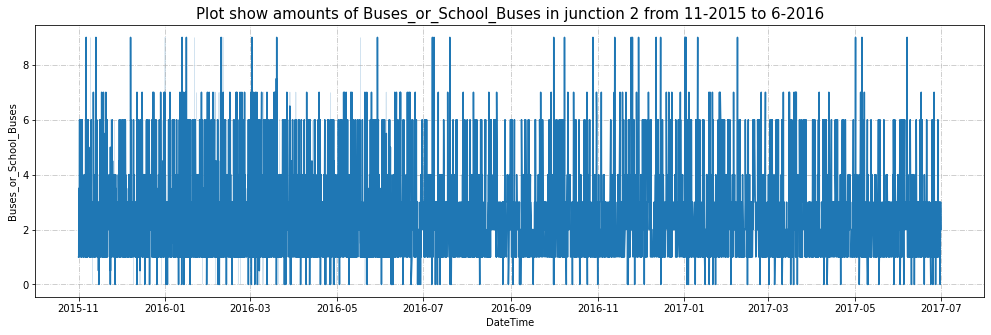

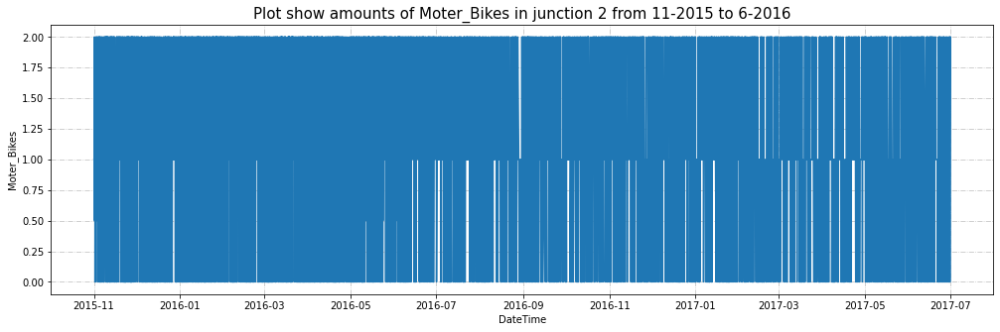

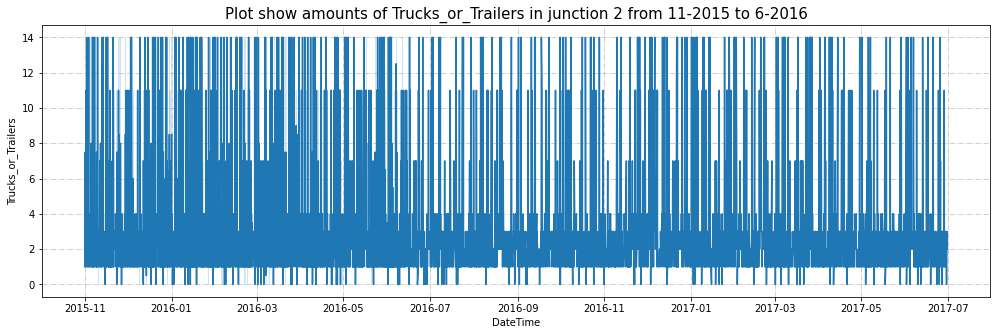

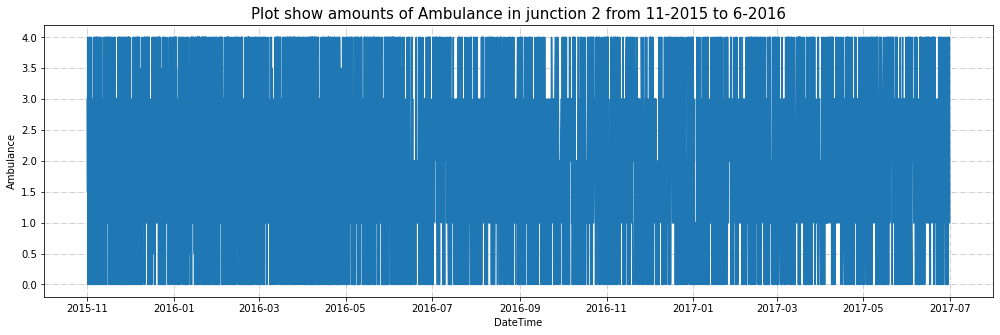

In [ ]:
for i in y_types:
  junction=2
  f, ax = plt.subplots(figsize=(17, 5))
  data=df_cp[df_cp.Junction == junction]
  ax = sns.lineplot(data=data, y=i, x='DateTime', ax=ax)
  start = data.head(1)
  end = data.tail(1)
  ax.set_title(f'Plot show amounts of {i} in junction {junction} from {start.Month[4]}-{start.Year[4]} to {end.Month[19999]}-{end.Year[19999]}', fontsize=15)
  ax.grid(True, ls='-.', alpha=0.75)
  plt.show()

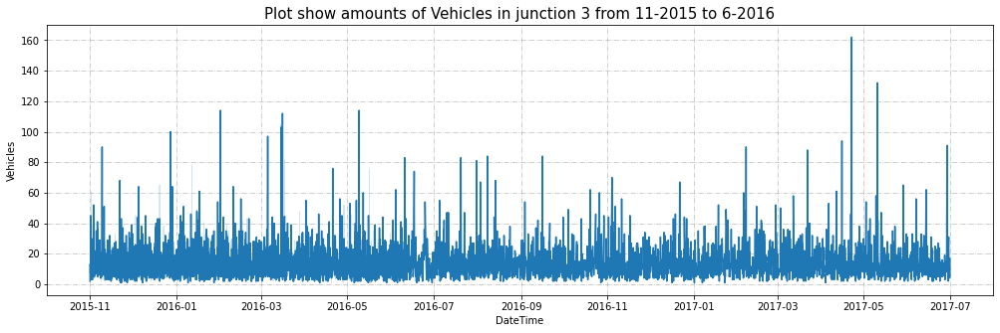

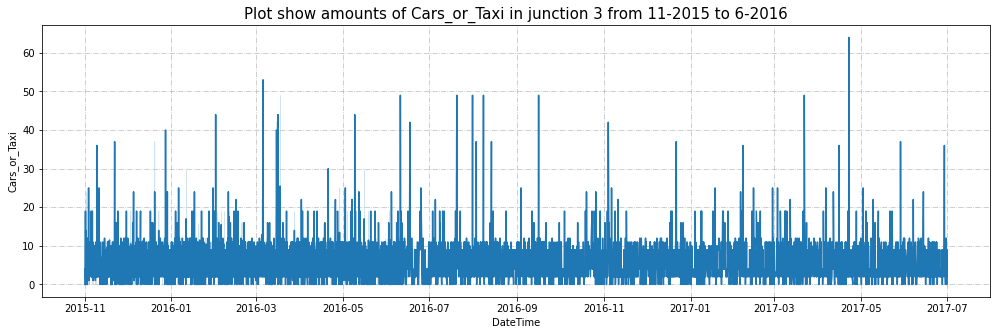

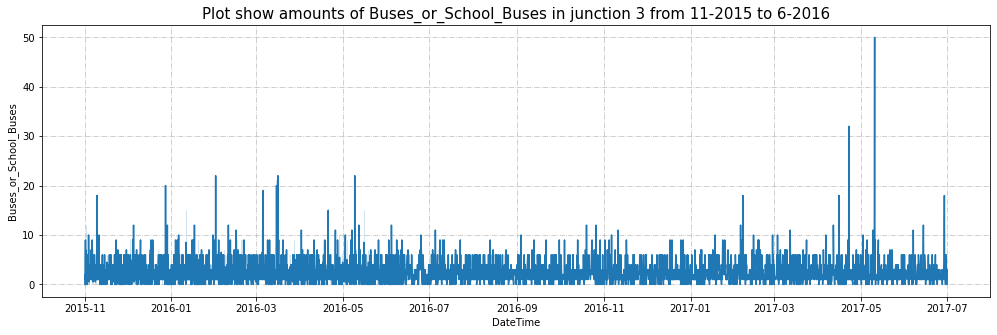

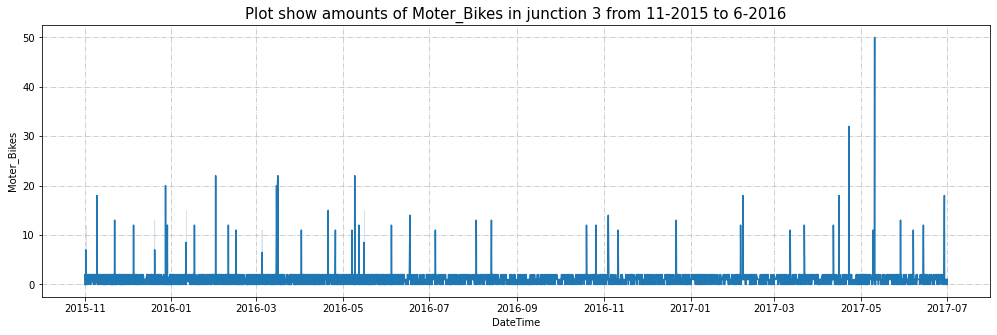

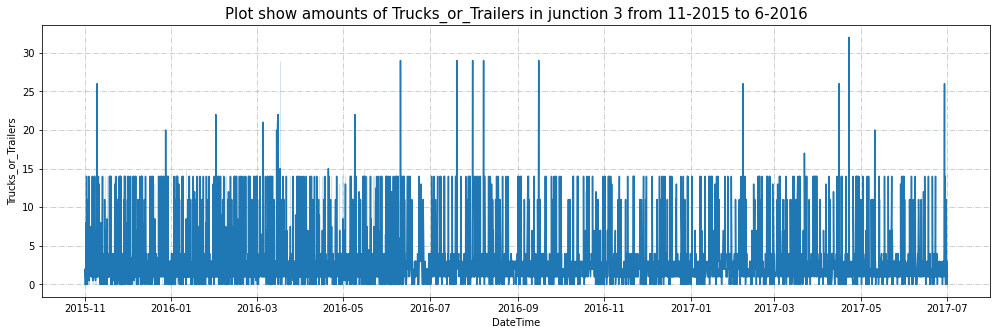

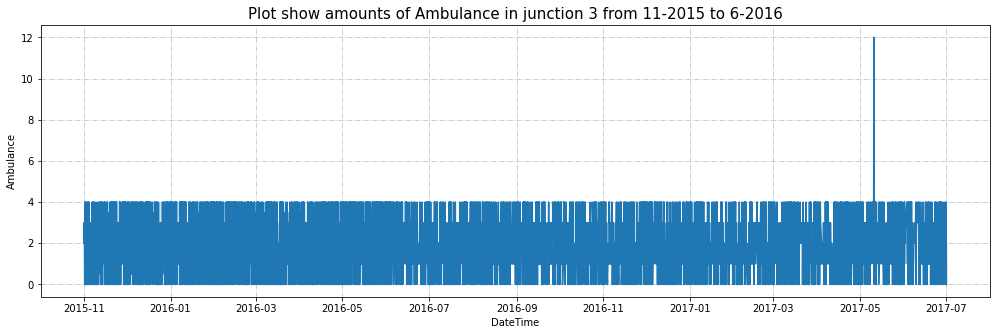

In [ ]:
for i in y_types:
  junction=3
  f, ax = plt.subplots(figsize=(17, 5))
  data=df_cp[df_cp.Junction == junction]
  ax = sns.lineplot(data=data, y=i, x='DateTime', ax=ax)
  start = data.head(1)
  end = data.tail(1)
  ax.set_title(f'Plot show amounts of {i} in junction {junction} from {start.Month[2]}-{start.Year[2]} to {end.Month[19996]}-{end.Year[19996]}', fontsize=15)
  ax.grid(True, ls='-.', alpha=0.75)
  plt.show()

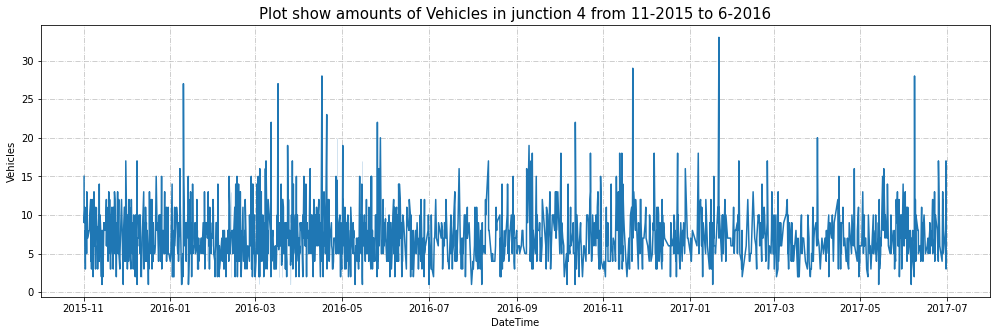

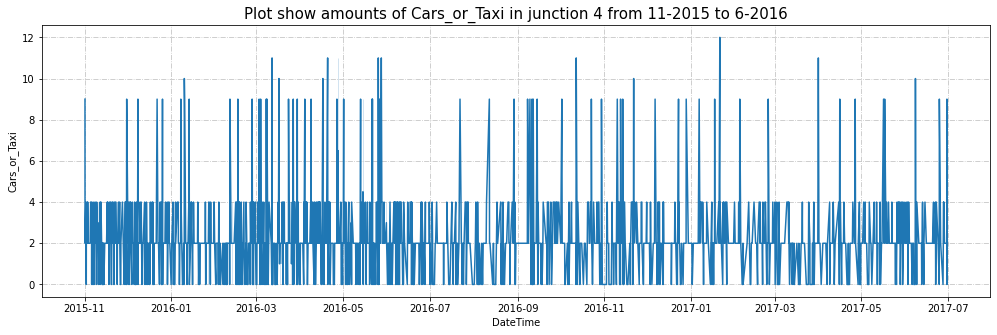

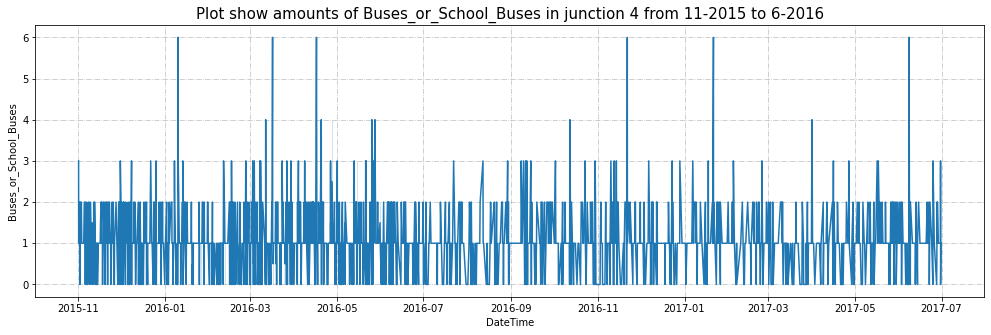

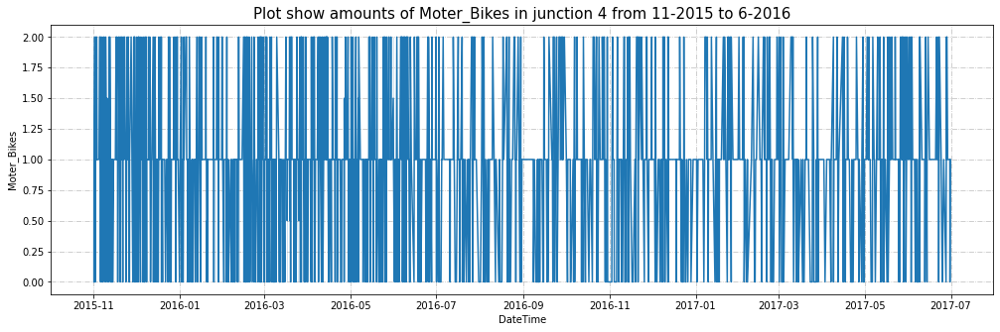

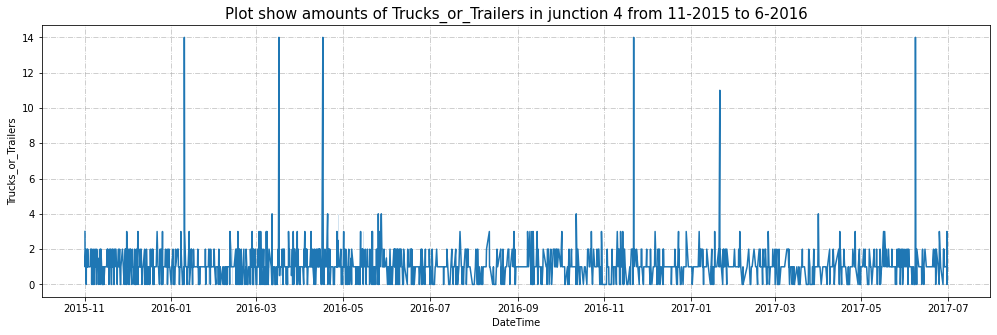

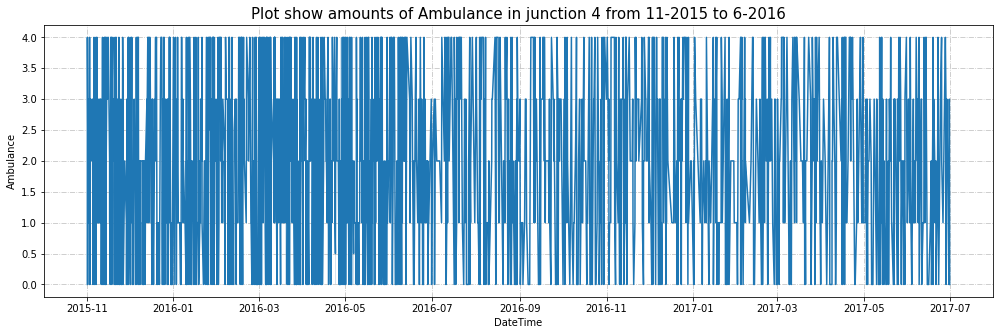

In [ ]:
for i in y_types:
  junction=4
  f, ax = plt.subplots(figsize=(17, 5))
  data=df_cp[df_cp.Junction == junction]
  ax = sns.lineplot(data=data, y=i, x='DateTime', ax=ax)
  start = data.head(1)
  end = data.tail(1)
  ax.set_title(f'Plot show amounts of {i} in junction {junction} from {start.Month[9]}-{start.Year[9]} to {end.Month[19970]}-{end.Year[19970]}', fontsize=15)
  ax.grid(True, ls='-.', alpha=0.75)
  plt.show()

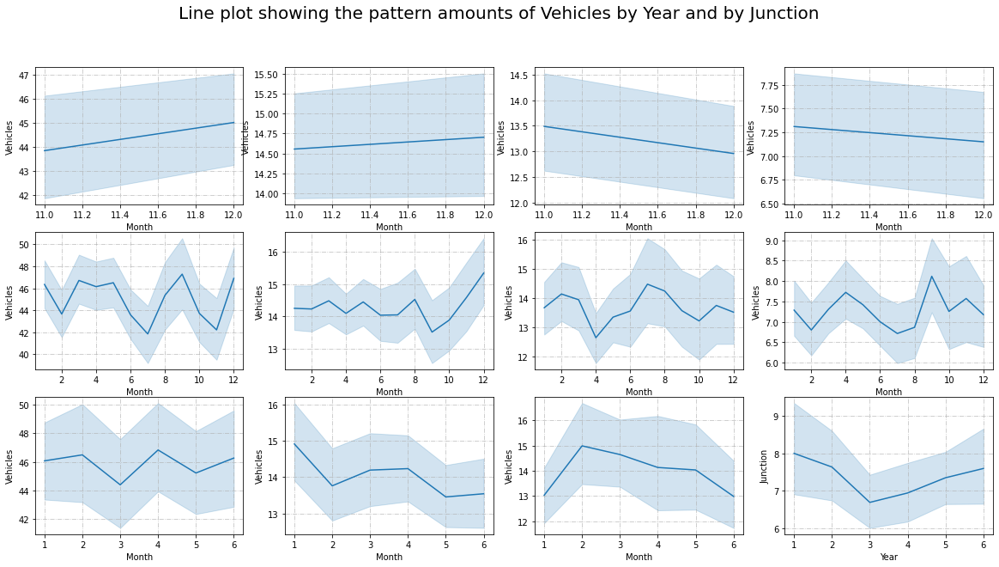

In [ ]:
f, ax = plt.subplots(3, 4, figsize=(20, 10))

for i, year in enumerate(range(2015, 2018)):
  for j, junction in enumerate(range(1, 5)):
    sns.lineplot(data=df_cp[(df_cp.Junction == junction) & (df_cp.Year == year)], x='Month', y='Vehicles', ax=ax[i, j])
    ax[i, j].grid(True, alpha=0.75, ls='-.')

plt.xlabel('Year')
plt.ylabel('Junction')
f.suptitle('Line plot showing the pattern amounts of Vehicles by Year and by Junction', fontsize=20)
plt.show()

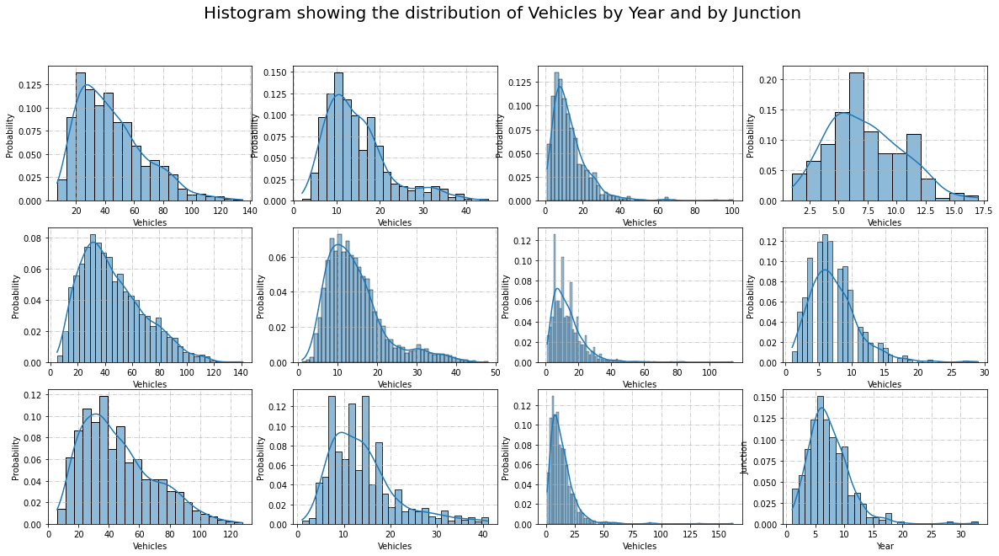

In [ ]:
f, axis = plt.subplots(3, 4, figsize=(20, 10))

for i, year in enumerate(range(2015, 2018)):
  for j, junction in enumerate(range(1, 5)):
    sns.histplot(df_cp[(df_cp.Junction == junction) & (df_cp.Year == year)]['Vehicles'], kde=True, ax=axis[i, j], stat='probability')
    axis[i, j].grid(True, alpha=0.75, ls='-.')

plt.xlabel('Year')
plt.ylabel('Junction')
f.suptitle('Histogram showing the distribution of Vehicles by Year and by Junction', fontsize=20)
plt.show()

Z Score data distribution and Histogram with Z Score Vehicles form Data


*   Mean = 0
*   Standard Deviation = 1



In [2]:
from sklearn.preprocessing import StandardScaler
standardization = lambda x: StandardScaler().fit_transform(x)

In [ ]:
z_df = df_cp.copy()
z_df['Vehicles'] = standardization(z_df.Vehicles.values.reshape(-1, 1))
z_df.head()

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction,Year,Month,Date_no,Hour,Day
0,12,6,1,11,1,0.380209,2015-11-01 00:00:00,1,2015,11,1,0,Sunday
1,19,7,2,7,3,0.714047,2015-11-01 01:00:00,1,2015,11,1,1,Sunday
2,4,2,2,2,3,-0.478233,2015-11-01 02:00:00,3,2015,11,1,2,Sunday
3,16,9,1,14,3,0.952503,2015-11-01 03:00:00,1,2015,11,1,3,Sunday
4,10,6,1,14,0,0.094061,2015-11-01 04:00:00,2,2015,11,1,4,Sunday


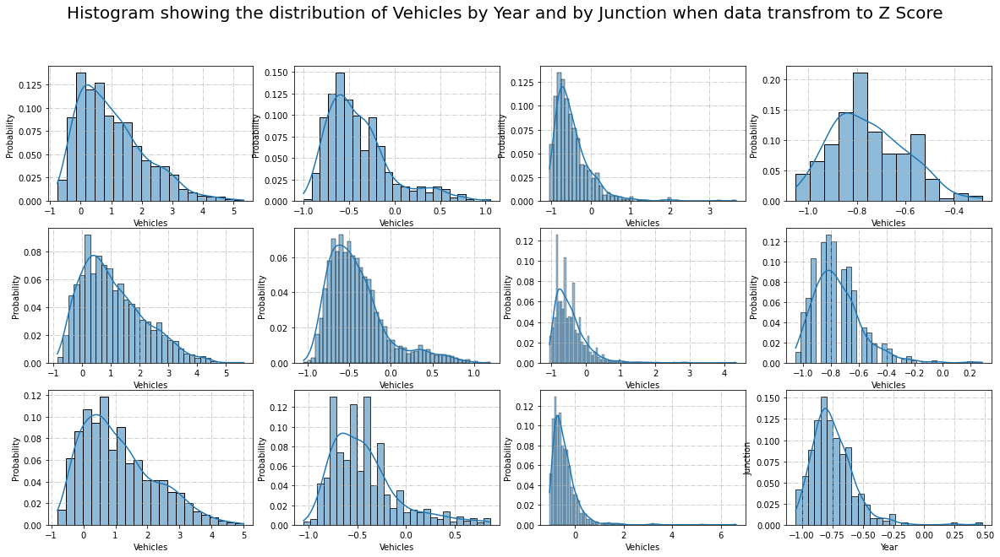

In [ ]:
f, axis = plt.subplots(3, 4, figsize=(20, 10))

for i, year in enumerate(range(2015, 2018)):
  for j, junction in enumerate(range(1, 5)):
    sns.histplot(z_df[(z_df.Junction == junction) & (z_df.Year == year)]['Vehicles'], kde=True, ax=axis[i, j], stat='probability')
    axis[i, j].grid(True, alpha=0.75, ls='-.')
    
plt.xlabel('Year')
plt.ylabel('Junction')
f.suptitle('Histogram showing the distribution of Vehicles by Year and by Junction when data transfrom to Z Score', fontsize=20)
plt.show()

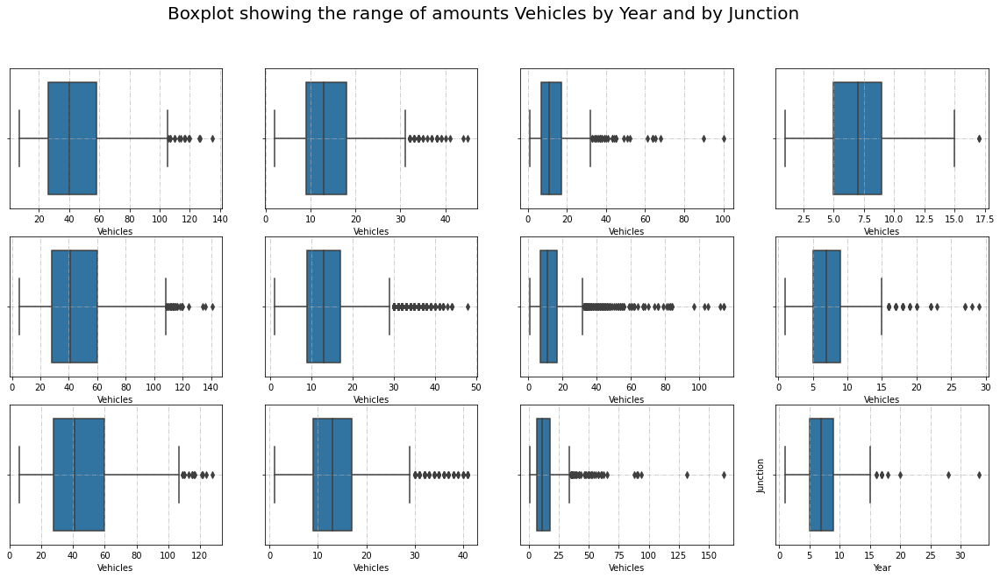

In [ ]:
f, axis = plt.subplots(3, 4, figsize=(20, 10))

for i, year in zip(range(3), range(2015, 2018)):
  for j, junction in zip(range(4), range(1, 5)):
    sns.boxplot(x=df_cp[(df_cp.Junction == junction) & (df_cp.Year == year)]['Vehicles'], ax=axis[i, j])
    axis[i, j].grid(True, alpha=0.75, ls='-.')

plt.xlabel('Year')
plt.ylabel('Junction')
f.suptitle('Boxplot showing the range of amounts Vehicles by Year and by Junction', fontsize=20)
plt.show()

In boxplot, we can see a lot of outliers (those which is the dot)

Lets make another cmap, just little bit more colorful

Heatmap about data attributes

* The value closer to 1 or -1 is best correlation to each other.
* As close as to -1, that pair of attribute is more negative correlation.
* As close as to 1, that pair of attribute is more positive correlation.
* As close as to 0, that pair of attribute is not correlating to each other.

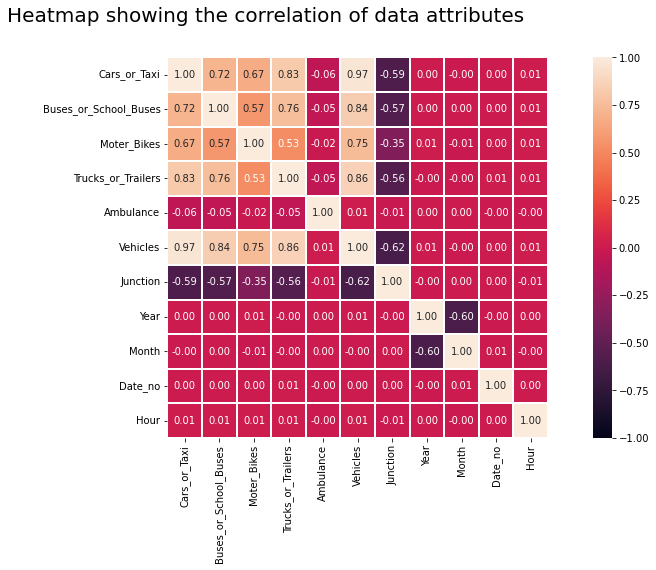

In [ ]:
corr = df_cp.corr()
f, ax = plt.subplots(figsize=(16, 7))
sns.heatmap(corr, annot=True, fmt='.2f', vmin=-1, vmax=1, square=True, linewidths=1)
f.suptitle('Heatmap showing the correlation of data attributes', fontsize=20)
plt.show()

In [3]:
def get_list_data(dataf, drop=[]):
  for i in drop:
    try:
      dataf.drop(drop, axis=1, inplace=True)
    except:
      print(f"{i} doesn't has in data")
  # create a list of dataframe has the data in that junction and remove the junction identify
  dataf = [dataf[dataf.Junction == i].drop('Junction', axis=1) for i in range(5)]
  return dataf

In [4]:
df_datetime = pd.read_excel('traffic_1122.xlsx', parse_dates=True, index_col='DateTime')

In [5]:
df_datetime['Year'] = pd.Series(df_datetime.index).apply(lambda x: x.year).to_list()

# extract month from date
df_datetime['Month'] = pd.Series(df_datetime.index).apply(lambda x: x.month).to_list()

# extract day from date
df_datetime['Day'] = pd.Series(df_datetime.index).apply(lambda x: x.day).to_list()

# extract hour from date
df_datetime['Hour'] = pd.Series(df_datetime.index).apply(lambda x: x.hour).to_list()

In [6]:
df_datetime.drop('ID', axis=1, inplace=True)

In [7]:
z_df_time = df_datetime.copy()
z_df_time['Vehicles'] = standardization(z_df_time.Vehicles.values.reshape(-1, 1))
z_df_time.head()

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,Junction,Year,Month,Day,Hour
DateTime,,,,,,,,,,,
2015-11-01 00:00:00,12,6,1,11,1,0.380209,1,2015,11,1,0
2015-11-01 01:00:00,19,7,2,7,3,0.714047,1,2015,11,1,1
2015-11-01 02:00:00,4,2,2,2,3,-0.478233,3,2015,11,1,2
2015-11-01 03:00:00,16,9,1,14,3,0.952503,1,2015,11,1,3
2015-11-01 04:00:00,10,6,1,14,0,0.094061,2,2015,11,1,4


In [8]:
data = get_list_data(df_datetime)
for i in data:
    print(i.head(1))

Empty DataFrame
Columns: [Cars_or_Taxi, Buses_or_School_Buses, Moter_Bikes, Trucks_or_Trailers, Ambulance, Vehicles, Year, Month, Day, Hour]
Index: []
            Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                       
2015-11-01            12                      6            1   

            Trucks_or_Trailers  Ambulance  Vehicles  Year  Month  Day  Hour  
DateTime                                                                     
2015-11-01                  11          1        31  2015     11    1     0  
                     Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                                
2015-11-01 04:00:00            10                      6            1   

                     Trucks_or_Trailers  Ambulance  Vehicles  Year  Month  \
DateTime                                                                    
2015-11-01 04:00:00                  14         

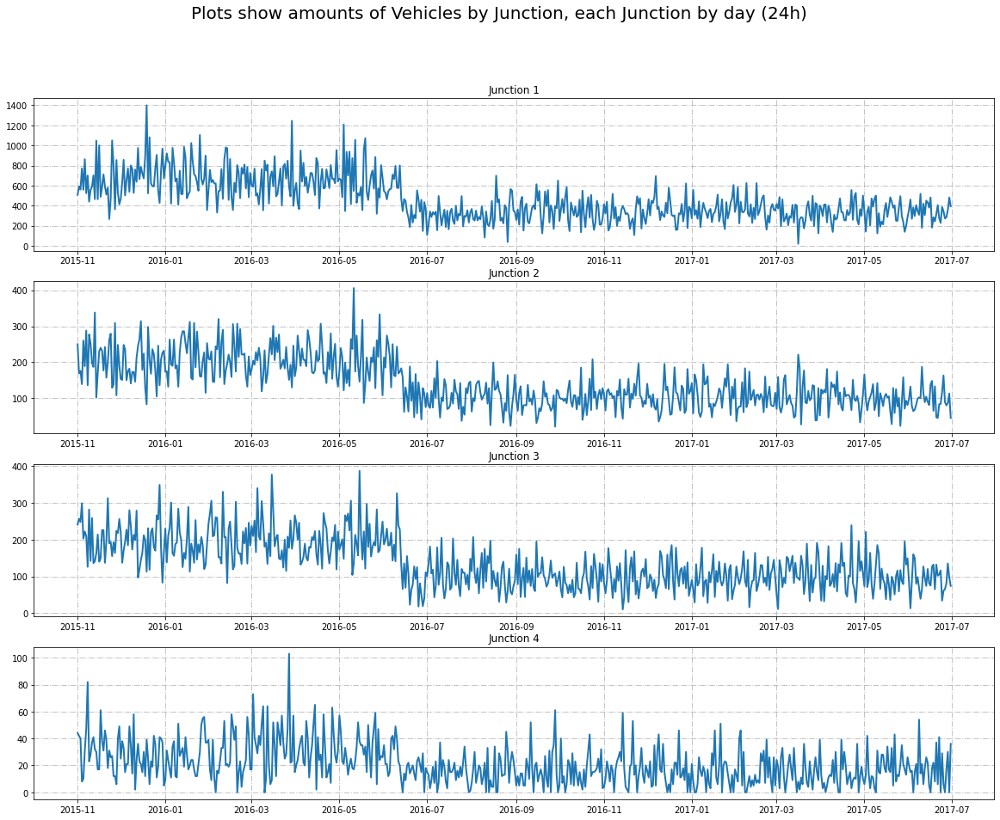

In [ ]:
f, ax = plt.subplots(nrows=4, figsize=(20, 15))
for i in range(4):
    ax[i].plot(data[i + 1].resample('D').sum().Vehicles, label=f'Vehicles of {i + 1} Junction', lw=2)
    ax[i].grid(True, alpha=0.75, lw=1, ls='-.')
    ax[i].set_title(f'Junction {i + 1}')
f.suptitle('Plots show amounts of Vehicles by Junction, each Junction by day (24h)', fontsize=20);

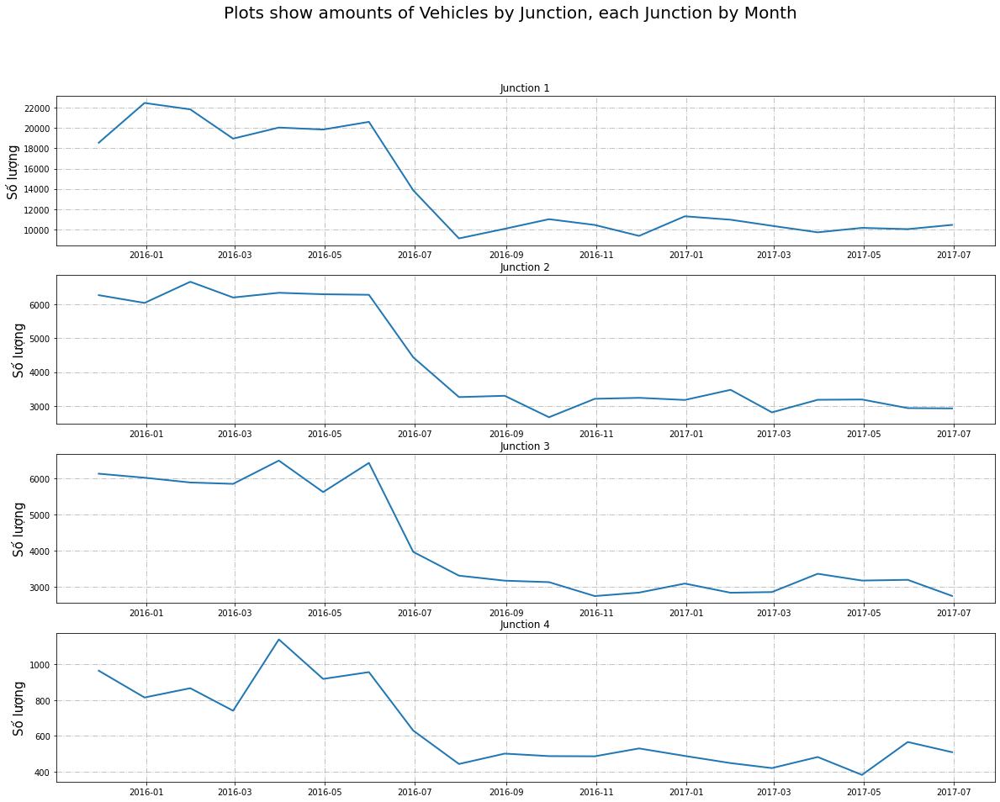

In [ ]:
f, ax = plt.subplots(nrows=4, figsize=(20, 15))
for i in range(4):
    ax[i].plot(data[i + 1].resample('M').sum().Vehicles, label=f'Vehicles of {i + 1} Junction', lw=2)
    ax[i].grid(True, alpha=0.75, lw=1, ls='-.')
    ax[i].set_ylabel('Số lượng', fontsize=15)
    ax[i].set_title(f'Junction {i + 1}')
f.suptitle('Plots show amounts of Vehicles by Junction, each Junction by Month', fontsize=20);

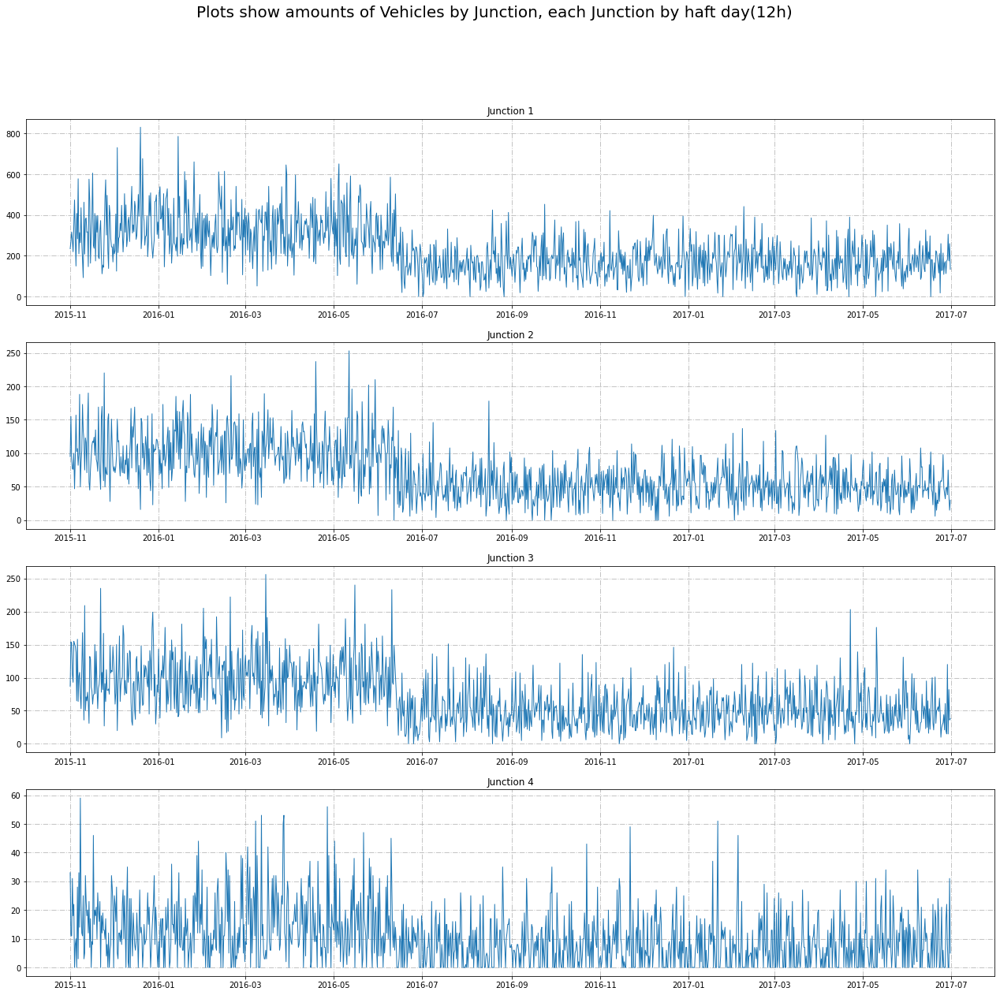

In [ ]:
f, ax = plt.subplots(nrows=4, figsize=(22, 20))
for i in range(4):
    ax[i].plot(data[i + 1].resample('12H').sum().Vehicles, label=f'Vehicles of {i + 1} Junction', lw=1)
    ax[i].grid(True, alpha=0.75, lw=1, ls='-.')
    ax[i].set_title(f'Junction {i + 1}')
f.suptitle('Plots show amounts of Vehicles by Junction, each Junction by haft day(12h)', fontsize=20);

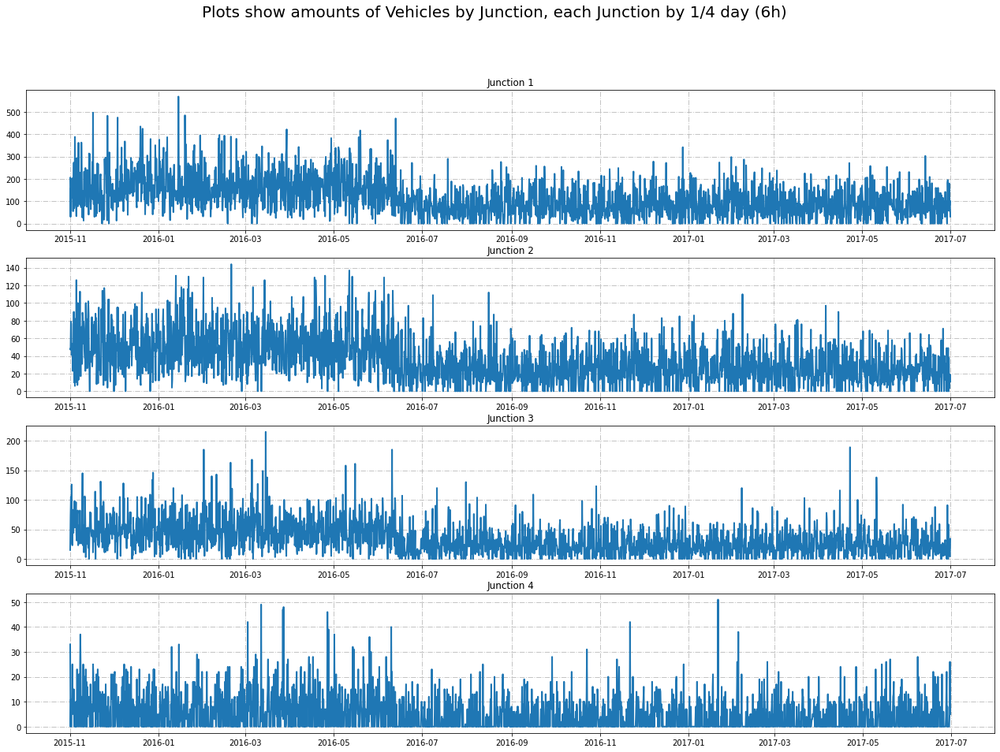

In [ ]:
f, ax = plt.subplots(nrows=4, figsize=(22, 15))
for i in range(4):
    ax[i].plot(data[i + 1].resample('6H').sum().Vehicles, label=f'Vehicles of {i + 1} Junction', lw=2)
    ax[i].grid(True, alpha=0.75, lw=1, ls='-.')
    ax[i].set_title(f'Junction {i + 1}')
f.suptitle('Plots show amounts of Vehicles by Junction, each Junction by 1/4 day (6h)', fontsize=20);

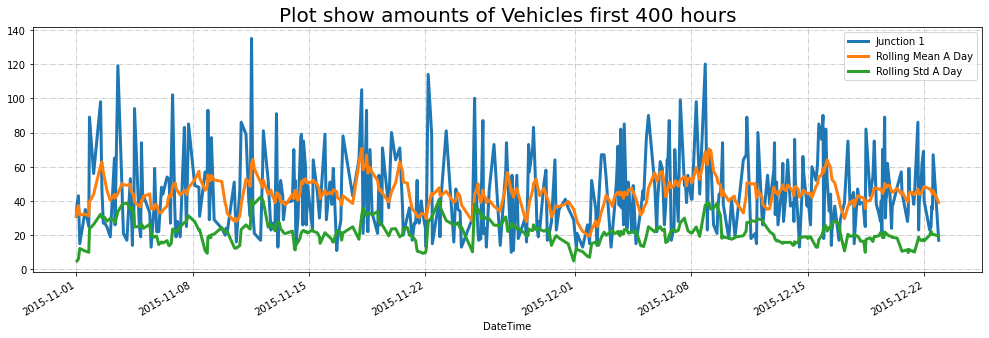

In [ ]:
f, ax = plt.subplots(figsize=(17, 5))
foo = data[1][:400]
foo.Vehicles.plot(lw=3)
foo.Vehicles.rolling('D').mean().plot(lw=3)
foo.Vehicles.rolling('D').std().plot(lw=3)
plt.legend(['Junction 1', 'Rolling Mean A Day', 'Rolling Std A Day'])
plt.grid(True, alpha=0.75, ls='-.')
plt.title('Plot show amounts of Vehicles first 400 hours', fontsize=20)
plt.show()

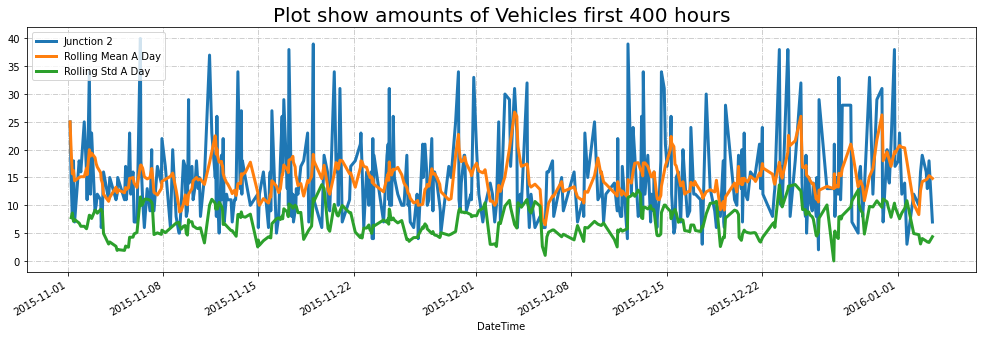

In [ ]:
f, ax = plt.subplots(figsize=(17, 5))
foo = data[2][:400]
foo.Vehicles.plot(lw=3)
foo.Vehicles.rolling('D').mean().plot(lw=3)
foo.Vehicles.rolling('D').std().plot(lw=3)
plt.legend(['Junction 2', 'Rolling Mean A Day', 'Rolling Std A Day'])
plt.grid(True, alpha=0.75, ls='-.')
plt.title('Plot show amounts of Vehicles first 400 hours', fontsize=20)
plt.show()

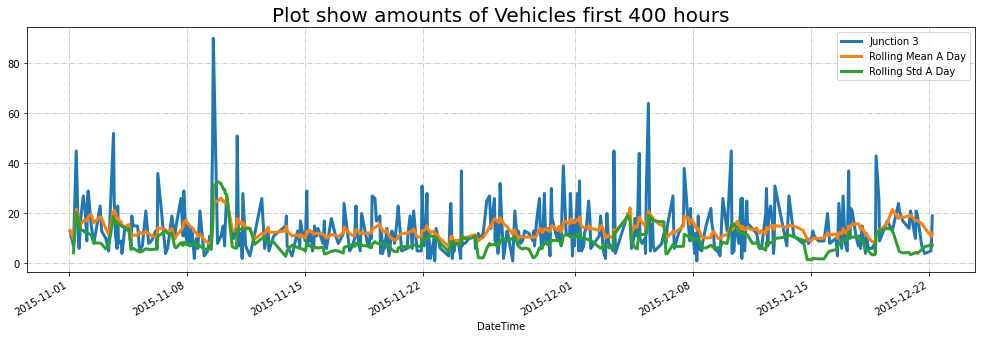

In [ ]:
f, ax = plt.subplots(figsize=(17, 5))
foo = data[3][:400]
foo.Vehicles.plot(lw=3)
foo.Vehicles.rolling('D').mean().plot(lw=3)
foo.Vehicles.rolling('D').std().plot(lw=3)
plt.legend(['Junction 3', 'Rolling Mean A Day', 'Rolling Std A Day'])
plt.grid(True, alpha=0.75, ls='-.')
plt.title('Plot show amounts of Vehicles first 400 hours', fontsize=20)
plt.show()

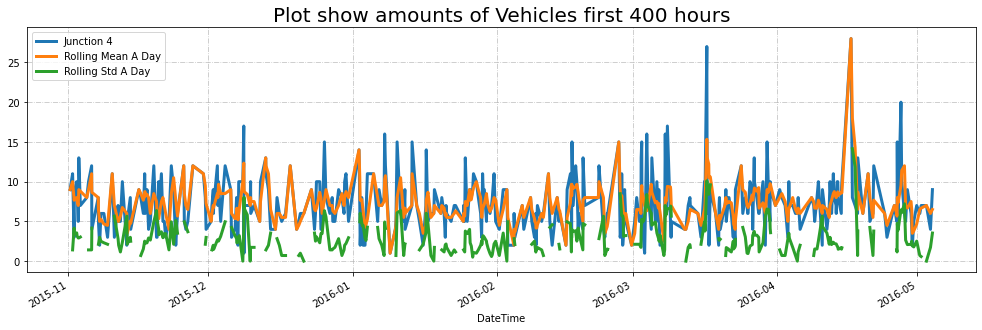

In [ ]:
f, ax = plt.subplots(figsize=(17, 5))
foo = data[4][:400]
foo.Vehicles.plot(lw=3)
foo.Vehicles.rolling('D').mean().plot(lw=3)
foo.Vehicles.rolling('D').std().plot(lw=3)
plt.legend(['Junction 4', 'Rolling Mean A Day', 'Rolling Std A Day'])
plt.grid(True, alpha=0.75, ls='-.')
plt.title('Plot show amounts of Vehicles first 400 hours', fontsize=20)
plt.show()

Auto correlation plot

* The data lie outside the blue has 95% effect to data

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
def make_autocorrelation(junction=1):
    f, ax = plt.subplots(figsize=(17, 6), nrows=2)
    plot_acf(data[junction].Vehicles, title=f"Autocorrelation of amounts of Vehicles in Junction {junction}", ax=ax[0])
    plot_pacf(data[junction].Vehicles, title=f"Partial Autocorrelation of amounts of Vehicles Junction {junction}", ax=ax[1])
    plt.show()

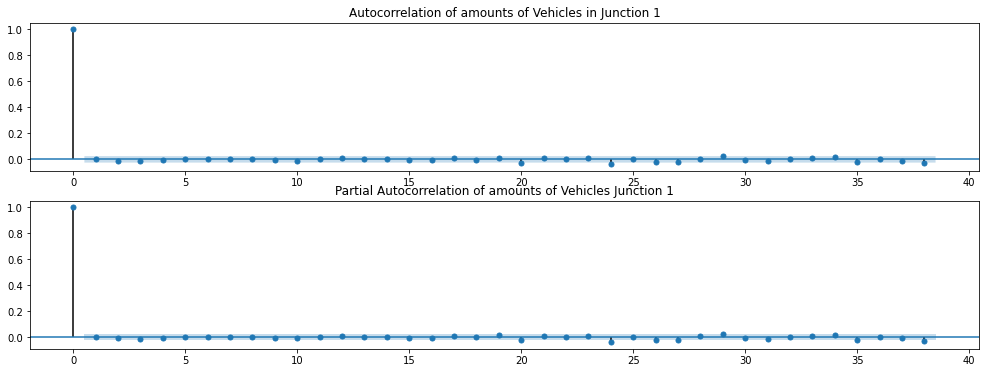

In [ ]:
make_autocorrelation(1)

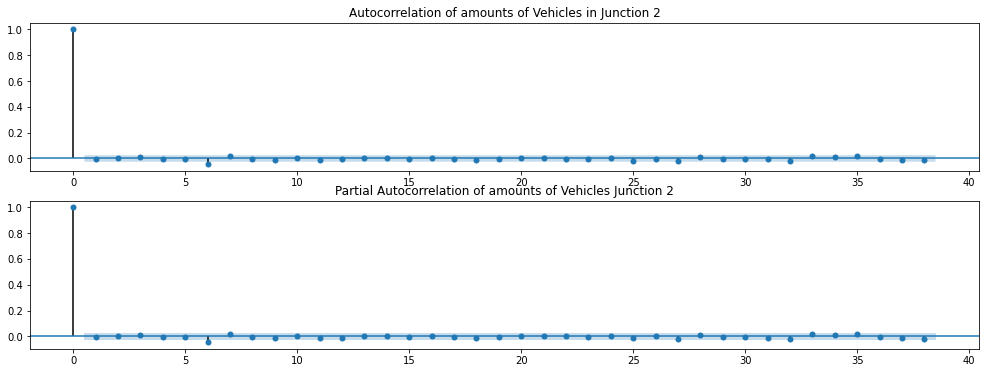

In [ ]:
make_autocorrelation(2)

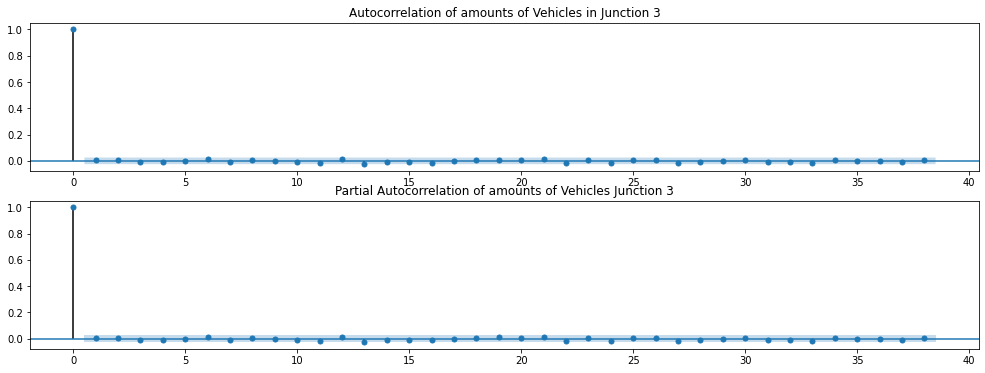

In [ ]:
make_autocorrelation(3)

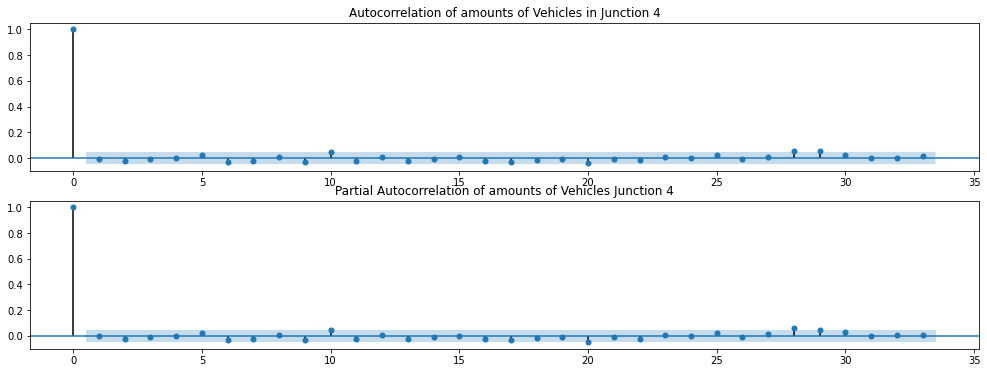

In [ ]:
make_autocorrelation(4)

* Month has negative correlation with Year
* The correlation of Vehicles and Year is equal to Vehicles and Hour

Can drop Year or Hour because it's the same


# Modeling

Create a make metrics function to return R² Score and RMSE from a list of models

In [9]:
def make_metrics(models):
    data = {
        'name': [model.name for model in models[1:]],
        'r2': [model.r2 for model in models[1:]],
        'rmse': [model.rmse for model in models[1:]]
    }
    data['name'] = 'average R2 and sum RMSE'
    data['r2'].append(np.mean(data['r2']))
    data['rmse'].append(np.sum(data['rmse']))
    return pd.DataFrame(data)

In [ ]:
data

[Empty DataFrame
 Columns: [Cars_or_Taxi, Buses_or_School_Buses, Moter_Bikes, Trucks_or_Trailers, Ambulance, Vehicles, Year, Month, Day, Hour]
 Index: [],
                      Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
 DateTime                                                                
 2015-11-01 00:00:00            12                      6            1   
 2015-11-01 01:00:00            19                      7            2   
 2015-11-01 03:00:00            16                      9            1   
 2015-11-01 05:00:00             9                      3            0   
 2015-11-01 13:00:00            19                      7            2   
 ...                           ...                    ...          ...   
 2016-06-12 20:00:00            36                     18           18   
 2016-06-12 23:00:00             4                      2            2   
 2016-06-13 01:00:00            10                      6            1   
 2016-06-13 03:00:00           

In [ ]:
z_df

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,DateTime,Junction,Year,Month,Date_no,Hour,Day
0,12,6,1,11,1,0.380209,2015-11-01 00:00:00,1,2015,11,1,0,Sunday
1,19,7,2,7,3,0.714047,2015-11-01 01:00:00,1,2015,11,1,1,Sunday
2,4,2,2,2,3,-0.478233,2015-11-01 02:00:00,3,2015,11,1,2,Sunday
3,16,9,1,14,3,0.952503,2015-11-01 03:00:00,1,2015,11,1,3,Sunday
4,10,6,1,14,0,0.094061,2015-11-01 04:00:00,2,2015,11,1,4,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19,9,1,2,0,1.047886,2016-06-13 03:00:00,1,2016,6,13,3,Monday
19996,4,2,2,2,1,-0.573616,2016-06-13 04:00:00,3,2016,6,13,4,Monday
19997,4,2,2,2,2,-0.525924,2016-06-13 05:00:00,2,2016,6,13,5,Monday
19998,19,7,2,7,1,0.618665,2016-06-13 06:00:00,1,2016,6,13,6,Monday


In [10]:
z_data = get_list_data(z_df_time)
for i in z_data:
    print(i.head(1))

Empty DataFrame
Columns: [Cars_or_Taxi, Buses_or_School_Buses, Moter_Bikes, Trucks_or_Trailers, Ambulance, Vehicles, Year, Month, Day, Hour]
Index: []
            Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                       
2015-11-01            12                      6            1   

            Trucks_or_Trailers  Ambulance  Vehicles  Year  Month  Day  Hour  
DateTime                                                                     
2015-11-01                  11          1  0.380209  2015     11    1     0  
                     Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                                
2015-11-01 04:00:00            10                      6            1   

                     Trucks_or_Trailers  Ambulance  Vehicles  Year  Month  \
DateTime                                                                    
2015-11-01 04:00:00                  14         

In [14]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor

In [15]:
class Model:
  def __init__(self, name, data, predict_features, test_size, ml_model):
    self.name = name
    self.data = data
    self.predict_features = predict_features
    self.is_trained = False
    self.test_size = test_size
    self.ml_model = ml_model
    self.do_things()

  def cal_rmse(self):
    self.rmse = mean_squared_error(self.ytest, self.ypredict, squared=False)
    return self.rmse

  def prequisite(self, test_size):
    self.features = [i for i in self.data.columns if i != self.predict_features]
    self.X = self.data[self.features].values
    self.y = self.data[self.predict_features].values
    self.Xtrain, self.Xtest, self.ytrain, self.ytest = train_test_split(self.X, self.y, test_size=test_size)
    return None

  def fit(self):
    self.is_trained = True
    self.ml_model.fit(self.Xtrain, self.ytrain)
    self.ypredict = self.ml_model.predict(self.Xtest)
    return self.ml_model

  def cal_r2_score(self):
    self.r2 = r2_score(self.ytest, self.ypredict)
    return self.r2

  def do_things(self) -> None:
    self.prequisite(self.test_size)
    self.fit()
    self.cal_rmse()
    self.cal_r2_score()
    return None

  def feature_importances(self, ax) -> None:
    feature_importances = self.ml_model.feature_importances_
    index = lag_models[1].features
    data = pd.DataFrame(pd.Series(feature_importances, index=index).nlargest(10)).reset_index()
    data.columns = ['Features', 'Value']
    g = sns.barplot(data=data, x='Features', y='Value', ax=ax)
    for p in g.patches:
        ax.annotate(
            format(p.get_height(), '.2f'),
            (p.get_x() + p.get_width() / 2, p.get_height() + 0.02),
            ha='center', va='center', weight='bold', fontsize=9
        )
    ax.set_title(f'Plot of {self.name}', fontsize=12)
    ax.grid(True, ls='-.', alpha=0.7)
    ax.set_ylim(0, 1)

  def __repr__(self) -> str:
    if not self.is_trained:
      return f'<{self.name}> (is not trained yet)>'
    return f'<({self.name}: [R² Score: {self.r2}], [RMSE: {self.rmse}])>'

Now we are at the last stages, im only doing the training for `vehicles` field, you can do the same for all type of vehicles available in data like `Cars_or_Taxi`, `Buses_or_School_Buses`, `Moter_Bikes`, `Trucks_or_Trailers`, `Ambulance`

Training models for 4 junction with normal data

# Random Forest Regressor for Regression

In [ ]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=RandomForestRegressor(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.999997,0.041900
1,average R2 and sum RMSE,0.999988,0.024809
2,average R2 and sum RMSE,0.999566,0.218913
3,average R2 and sum RMSE,0.999331,0.087385
4,average R2 and sum RMSE,0.999721,0.373007


Training models for 4 junction with Z Score Normalization

In [ ]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=RandomForestRegressor(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.999399,0.026778
1,average R2 and sum RMSE,0.999206,0.009785
2,average R2 and sum RMSE,0.917127,0.145547
3,average R2 and sum RMSE,0.993073,0.015683
4,average R2 and sum RMSE,0.977201,0.197793


# Linear Regression

In [16]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=LinearRegression(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986837,2.642276e+00
1,average R2 and sum RMSE,0.995231,5.218565e-01
2,average R2 and sum RMSE,0.993108,9.060631e-01
3,average R2 and sum RMSE,1.000000,1.012165e-13
4,average R2 and sum RMSE,0.993794,4.070196e+00


In [17]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=LinearRegression(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986745,0.126614
1,average R2 and sum RMSE,0.995286,0.023095
2,average R2 and sum RMSE,0.993615,0.038120
3,average R2 and sum RMSE,0.997462,0.009263
4,average R2 and sum RMSE,0.993277,0.197092


# LGBM Regressor

In [18]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=LGBMRegressor(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.998527,0.904871
1,average R2 and sum RMSE,0.999891,0.075037
2,average R2 and sum RMSE,0.995846,0.708669
3,average R2 and sum RMSE,0.989460,0.366021
4,average R2 and sum RMSE,0.995931,2.054598


In [19]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=LGBMRegressor(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.998376,0.045054
1,average R2 and sum RMSE,0.999792,0.005058
2,average R2 and sum RMSE,0.976648,0.078648
3,average R2 and sum RMSE,0.963253,0.035451
4,average R2 and sum RMSE,0.984517,0.164212


# XGBoost Regressor

In [20]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=XGBRegressor(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

[04:22:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,name,r2,rmse
0,average R2 and sum RMSE,0.999968,0.131293
1,average R2 and sum RMSE,0.999992,0.020163
2,average R2 and sum RMSE,0.985278,1.253984
3,average R2 and sum RMSE,0.999976,0.017431
4,average R2 and sum RMSE,0.996303,1.422871


In [21]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=XGBRegressor(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

[04:22:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:22:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,name,r2,rmse
0,average R2 and sum RMSE,0.999960,0.007033
1,average R2 and sum RMSE,0.999861,0.004212
2,average R2 and sum RMSE,0.999936,0.003866
3,average R2 and sum RMSE,0.999962,0.001078
4,average R2 and sum RMSE,0.999930,0.016189


# Stochastic Gradient Descent Regression

In [22]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=SGDRegressor(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,-8.316607e+27,2.065661e+15
1,average R2 and sum RMSE,-5.477088e+28,1.657184e+15
2,average R2 and sum RMSE,-1.208102e+28,1.174521e+15
3,average R2 and sum RMSE,-3.718308e+29,2.240543e+15
4,average R2 and sum RMSE,-1.117498e+29,7.137908e+15


In [23]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=SGDRegressor(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,-1.222056e+30,1.227823e+15
1,average R2 and sum RMSE,-1.138430e+31,1.171702e+15
2,average R2 and sum RMSE,-3.514559e+29,2.793552e+14
3,average R2 and sum RMSE,-3.654602e+30,3.298559e+14
4,average R2 and sum RMSE,-4.153102e+30,3.008736e+15


# Kernel Ridge Regression

In [24]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=KernelRidge(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986383,2.589704
1,average R2 and sum RMSE,0.995121,0.511651
2,average R2 and sum RMSE,0.992846,0.849227
3,average R2 and sum RMSE,0.999936,0.028680
4,average R2 and sum RMSE,0.993571,3.979263


In [25]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=KernelRidge(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986940,0.125090
1,average R2 and sum RMSE,0.995106,0.024601
2,average R2 and sum RMSE,0.994348,0.036775
3,average R2 and sum RMSE,0.997451,0.008902
4,average R2 and sum RMSE,0.993461,0.195369


# Elastic Net Regression

In [26]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=ElasticNet(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.985610,2.697393
1,average R2 and sum RMSE,0.964747,1.378145
2,average R2 and sum RMSE,0.987866,1.078014
3,average R2 and sum RMSE,0.898791,1.120448
4,average R2 and sum RMSE,0.959254,6.274000


In [27]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=ElasticNet(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.967413,0.198053
1,average R2 and sum RMSE,0.715849,0.190184
2,average R2 and sum RMSE,0.799341,0.231291
3,average R2 and sum RMSE,-0.004679,0.183367
4,average R2 and sum RMSE,0.619481,0.802894


# Bayesian Ridge Regression

In [28]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=BayesianRidge(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986247,2.687826e+00
1,average R2 and sum RMSE,0.994908,5.205863e-01
2,average R2 and sum RMSE,0.992904,9.542457e-01
3,average R2 and sum RMSE,1.000000,2.786047e-11
4,average R2 and sum RMSE,0.993515,4.162658e+00


In [29]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=BayesianRidge(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.986643,0.124353
1,average R2 and sum RMSE,0.995135,0.024652
2,average R2 and sum RMSE,0.989917,0.048207
3,average R2 and sum RMSE,0.997610,0.008901
4,average R2 and sum RMSE,0.992326,0.206114


# Gradient Boosting Regression

In [30]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=GradientBoostingRegressor(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.999971,0.124146
1,average R2 and sum RMSE,0.999789,0.106955
2,average R2 and sum RMSE,0.953273,2.458621
3,average R2 and sum RMSE,0.999892,0.037156
4,average R2 and sum RMSE,0.988231,2.726877


In [31]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=GradientBoostingRegressor(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.999972,0.005852
1,average R2 and sum RMSE,0.999993,0.000886
2,average R2 and sum RMSE,0.952767,0.114796
3,average R2 and sum RMSE,0.999731,0.002970
4,average R2 and sum RMSE,0.988116,0.124504


# Support Vector Machine

In [32]:
models = [None]
for i in range(1, 5):
    models += [
        Model(
            ml_model=SVR(),
            name=f'Dataset of junction {i}',
            data=data[i],
            predict_features='Vehicles', # you can change this field according to the above cell.
            test_size=1/4
        )
    ]
    
make_metrics(models)

,name,r2,rmse
0,average R2 and sum RMSE,0.005519,23.387279
1,average R2 and sum RMSE,-0.031902,7.850518
2,average R2 and sum RMSE,-0.036146,9.767207
3,average R2 and sum RMSE,-0.018011,3.584453
4,average R2 and sum RMSE,-0.020135,44.589457


In [33]:
z_models = [None]
for i in range(1, 5):
    z_models += [
        Model(
            ml_model=SVR(),
            name=f'Dataset of junction {i}',
            data=z_data[i],
            predict_features='Vehicles',
            test_size=1/4
        )
    ]

make_metrics(z_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.503323,0.781380
1,average R2 and sum RMSE,0.144775,0.313616
2,average R2 and sum RMSE,0.223083,0.456618
3,average R2 and sum RMSE,0.018779,0.165732
4,average R2 and sum RMSE,0.222490,1.717346


**Create lag data**

In [ ]:
lag_df_datetime = df_datetime.copy()
for i in range(1, 3):
    lag_df_datetime[f'Vehicles_lag_{i}'] = df_datetime.Vehicles.shift(i)

# drop all rows with nan, because lag data cause nan
lag_df_datetime.dropna(inplace=True)
lag_df_datetime.head()

,Cars_or_Taxi,Buses_or_School_Buses,Moter_Bikes,Trucks_or_Trailers,Ambulance,Vehicles,Junction,Year,Month,Day,Hour,Vehicles_lag_1,Vehicles_lag_2
DateTime,,,,,,,,,,,,,
2015-11-01 02:00:00,4,2,2,2,3,13,3,2015,11,1,2,38.0,31.0
2015-11-01 03:00:00,16,9,1,14,3,43,1,2015,11,1,3,13.0,38.0
2015-11-01 04:00:00,10,6,1,14,0,25,2,2015,11,1,4,43.0,13.0
2015-11-01 05:00:00,9,3,0,3,0,15,1,2015,11,1,5,25.0,43.0
2015-11-01 06:00:00,4,2,2,2,4,14,2,2015,11,1,6,15.0,25.0


In [ ]:
lag_data = get_list_data(lag_df_datetime, drop=['Year'])
for i in lag_data:
    print(i.head(1))


Empty DataFrame
Columns: [Cars_or_Taxi, Buses_or_School_Buses, Moter_Bikes, Trucks_or_Trailers, Ambulance, Vehicles, Month, Day, Hour, Vehicles_lag_1, Vehicles_lag_2]
Index: []
                     Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                                
2015-11-01 03:00:00            16                      9            1   

                     Trucks_or_Trailers  Ambulance  Vehicles  Month  Day  \
DateTime                                                                   
2015-11-01 03:00:00                  14          3        43     11    1   

                     Hour  Vehicles_lag_1  Vehicles_lag_2  
DateTime                                                   
2015-11-01 03:00:00     3            13.0            38.0  
                     Cars_or_Taxi  Buses_or_School_Buses  Moter_Bikes  \
DateTime                                                                
2015-11-01 04:00:00            10               

**Lag data is appropriate for time series data, use for create the auto correlation**

In [ ]:
lag_models = [None]
for i in range(1, 5):
    lag_models += [
        Model(
            ml_model=RandomForestRegressor(),
            name=f'Dataset of junction {i} with lag data',
            data=lag_data[i],
            predict_features='Vehicles',
            test_size=1/3
        )
    ]

make_metrics(lag_models)

,name,r2,rmse
0,average R2 and sum RMSE,0.999515,0.505176
1,average R2 and sum RMSE,0.999995,0.015650
2,average R2 and sum RMSE,0.928977,2.909768
3,average R2 and sum RMSE,0.995530,0.255002
4,average R2 and sum RMSE,0.981004,3.685596


**Feature importances of a model**

> The correlate value as close as 1 is best



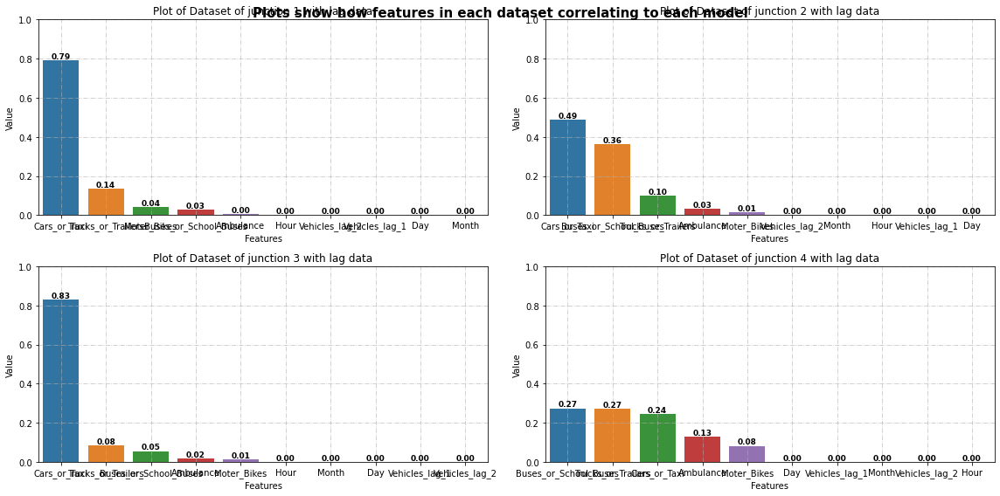

In [ ]:
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
k = 1
for i in range(2):
    for j in range(2):
        lag_models[k].feature_importances(ax[i, j])
        k += 1
f.suptitle('Plots show how features in each dataset correlating to each model', fontsize=15, fontweight='bold')        
f.tight_layout()

**Predict for next 4 months**



> I predicted for each Junction separately. I used previous prediction amounts of Vehicles for predicting next amounts of Vehicles.




In [ ]:
from datetime import timedelta
for junction in range(1, 5):
    cur_time = lag_data[junction].tail(1).index[0] # get the current time, the last time of that dataset
    end_time = pd.Timestamp(2017, 11, 1, 0, 0, 0) # the end time after 4 months that we want to predict
    new_data = lag_data[junction].copy() # create a copy of dataset with that junction
    features = lag_models[junction].features # get features of each models in that junction
    while cur_time != end_time:
        last = new_data.tail(1).copy() # get the last row of dataset, just make a copy!
        new_data = pd.concat([new_data, last]) # concatenate the copy dataset with it's last row
        for i in range(1, 3): # create lag data
            new_data[f'Vehicles_lag_{i}'] = new_data.Vehicles.shift(i) # shift by periods i
        new_data.iloc[len(new_data) - 1, [1, 2, 3]] = [cur_time.month, cur_time.day, cur_time.hour] # assign value for those columns
        last = new_data[features].tail(1).values # create a new last data that drop all nan
        new_data.iloc[len(new_data) - 1, 0] = round(lag_models[1].ml_model.predict(last)[0]) # predicting for vehicles
        cur_time += timedelta(hours=1) # add to a cur_time 1 hour
    new_data.index = pd.date_range(
        start=lag_data[junction].head(1).index.values[0],
        end=pd.Timestamp(2017, 11, 1, 0, 0, 0),
        freq='H'
    ) # reassign index with the new time range with start is the start of data
      # and end time is the end time that initialize in start of the loop
    new_data.to_csv(f'vehicles_for_next_4_months_in_junction_{junction}.csv') # to csv that file
    print(f'|==Predicted for Junction {junction}==|')

ValueError: ignored